 - configura a seed das funções randomicas, para reproducibilidade;
 - ~~desativa a GPU;~~

In [1]:
import numpy as np
import tensorflow as tf
import os
np.random.seed(1337)  # for reproducibility
tf.random.set_seed(1337)
os.environ['TF_DETERMINISTIC_OPS'] = str(1)


# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

## Carregando dados e features.

A função load_data precura pelo arquivo `.csv`, caso não o encontre, irá baixar/construir os dados e montar este arquivo csv

In [2]:
from data.utils import load_data
from data.scaling import normalize
coin = 'BTC'
df = load_data(coin, 'bitcoin', event_days_left_lookback=7, storage_folder='../data').iloc[:, :]
df.head()

# df.iloc[-20:, 5:]

,High,Low,Open,Close,Volume,Marketcap,price,price (%),tweet_volume,trend,...,event_in_3_days_votes,event_in_3_days_confidence,event_in_4_days_votes,event_in_4_days_confidence,event_in_5_days_votes,event_in_5_days_confidence,event_in_6_days_votes,event_in_6_days_confidence,event_in_7_days_votes,event_in_7_days_confidence
date,,,,,,,,,,,,,,,,,,,,,
2014-04-09,455.727997,441.933014,453.177002,442.725006,13204400.0,5.589580e+09,447.951004,-0.005326,8193.0,11.193,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2014-04-10,443.365997,358.731995,442.256012,365.175995,55868300.0,4.611917e+09,403.716003,-0.098750,15039.0,13.854,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2014-04-11,429.766998,351.272003,363.709991,420.946991,62562800.0,5.318034e+09,392.328491,-0.028207,14907.0,12.997,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2014-04-12,439.605988,415.789001,420.889008,421.115997,19226500.0,5.321875e+09,421.002502,0.073087,7582.0,9.229,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2014-04-13,427.398010,395.253998,421.460999,414.062988,22493500.0,5.234667e+09,417.761993,-0.007697,10674.0,10.385,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN


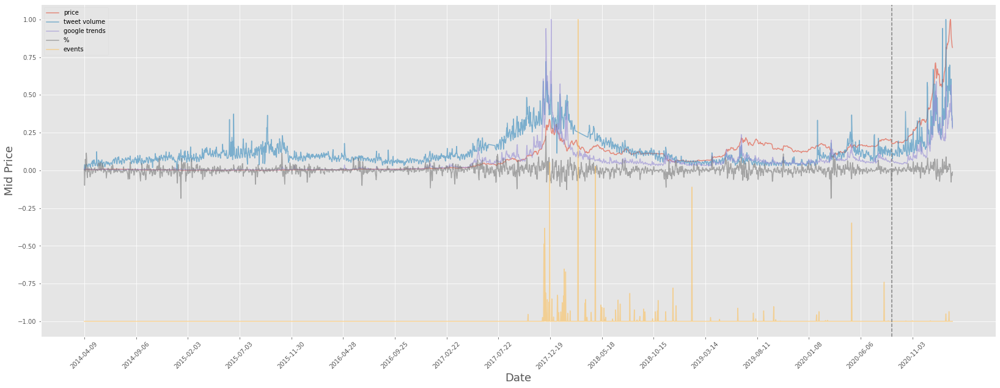

<module 'matplotlib.pyplot' from 'C:\\Users\\jgmu6\\AppData\\Local\\Programs\\Python\\Python38\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [3]:
from data.visualization import plot_data
import pandas as pd
prices, _ = normalize(df.loc[:, 'price'].to_numpy(), range=(0,1))
variation = df.loc[:, 'price'].pct_change().fillna(0).to_numpy()
tweet, _ = normalize(df.loc[:, 'tweet_volume'].to_numpy(), range=(0,1))
google_trends, _ = normalize(df.loc[:, 'trend'].to_numpy(), range=(0,1))
events, _ = normalize((df.loc[:, 'event_votes'].fillna(0)).to_numpy(), range=(-1,1))
plot_data([prices, tweet, google_trends, variation, events], 
          legends=['price', 'tweet volume', 'google trends', '%', 'events'], tick=150,
          verticalLineAt=len(prices)*0.93, labels=df.index.date[::150], blocking=False)

Carrega e normaliza (entre -1 e 1) as **features de preço**, **variação de preço**, **volume de tweets** e **google trends**.<br/>
variação de preço, volume de tweets e google trends são expressos em porcentagem/variação.

In [4]:
prices, _ = normalize(df.loc[:, 'price'].to_numpy())
variation = df.loc[:, 'price (%)'].to_numpy()
# variation = df.loc[:, 'price'].pct_change().fillna(0).to_numpy()
volume, _ = normalize(df['Volume'].to_numpy())
volume_variation = df['Volume'].pct_change().fillna(0).to_numpy()
tweet, _ = normalize(df.loc[:, 'tweet_volume'].to_numpy())
tweet_variation = df.loc[:, 'tweet_volume'].pct_change().fillna(0).to_numpy()
google_trends, _ = normalize(df.loc[:, 'trend'].to_numpy())
google_trends_variation = df.loc[:, 'trend'].pct_change().fillna(0).to_numpy()

prices[:3], variation[:3], google_trends[:3]

(array([-0.99100595, -0.99256873, -0.99297103]),
 array([-0.00532586, -0.09874964, -0.02820674]),
 array([-0.98062456, -0.97192278, -0.97472527]))

carrega as **features de eventos**.

Seja _**N**_ a quantidade de passos (dias) que a chegada de um evento deve ser informada com antecedência,<br/>
2(_**N**_ + 1) séries temporais de eventos são carregadas, onde:
 - para a quantidade de votos de um evento, 1 indicará o anúncio de um evento + _**N**_ indicarão quantos dias faltam.
 - para a confiabilidade de um evento, 1 indicará o anúncio de um evento + _**N**_ indicação quantos dias faltam.

Cada série temporal representa quantos dias faltam para um evento chegar. Por exemplo:<br/>
para<br/> 
 - `N=3`
 - `Evento A - anunciado dia 0 - acontece dia 6 - pontuação 2 - confiabilidade 0.9`
 - `Evento B - anunciado dia 5 - acontece dia 8 - pontuação 3 - confiabilidade 0.7`

        as seguintes series temporais serão criadas:

>>
`anuncio_de_evento_votes = [2,  0,  0,  0,  0,  3,  0,  0,  0,  0,  0]`<br/>
`evento_falta_3_dia_votes= [0,  0,  0,  2,  0,  3,  0,  0,  0,  0,  0]`<br/>
`evento_falta_2_dia_votes= [0,  0,  0,  0,  2,  0,  3,  0,  0,  0,  0]`<br/>
`evento_falta_1_dia_votes= [0,  0,  0,  0,  0,  2,  0,  3,  0,  0,  0]`<br/>

>>
`anuncio_de_evento_confi = [.9,0,  0,  0,  0,.7,  0,  0,  0,  0,  0]`<br/>
`evento_falta_3_dia_confi= [0,  0,  0,.9,  0,.7,  0,  0,  0,  0,  0]`<br/>
`evento_falta_2_dia_confi= [0,  0,  0,  0,.9,  0,.7,  0,  0,  0,  0]`<br/>
`evento_falta_1_dia_confi= [0,  0,  0,  0,  0,.9,  0,.7,  0,  0,  0]`<br/>

para mais detalhes veja a função `eventTimeSeries_to_many()` em [data/utils.py](./data/utils.py)


Aqui o scaler (objeto que normaliza os dados) da série temporal `votos de anúncio de evento` e `confiabilidade de anúncio de evento` são aplicados também 

In [5]:
# event_day_count, _ = normalize(df.loc[:, 'days_to_event_happen'].fillna(0).to_numpy())
event_votes, votes_scaler = normalize(df.loc[:, 'event_votes'].fillna(0).to_numpy(), range=(0,1))
event_confidence, conf_scaler = normalize(df.loc[:, 'event_confidence'].to_numpy(), range=(-1,1))   # mantém os nan fora da normalização, e então converte para 0.0
event_confidence = np.nan_to_num(event_confidence)
event_votes_features = [event_votes]
event_confidence_features = [event_confidence]
for i in range(5):
    votes, confidence = df[f'event_in_{i+1}_days_votes'].to_numpy(), df[f'event_in_{i+1}_days_confidence'].to_numpy()
    votes =  votes_scaler.transform(votes.reshape(-1,1)).reshape(-1)
    confidence =  conf_scaler.transform(confidence.reshape(-1,1)).reshape(-1)
    confidence = np.nan_to_num(confidence)

    event_votes_features.append(votes)
    event_confidence_features.append(confidence)

# se mostraram meio inuteis, optei por não inclui-los nas features
# df = add_indicadores_tecnicos(df)
# MACD_50_200_21, _ = normalize(df.loc[:, 'MACD_50_200_21'].to_numpy())
# MACDh_50_200_21, _ = normalize(df.loc[:, 'MACDh_50_200_21'].to_numpy())
# MACDs_50_200_21, _ = normalize(df.loc[:, 'MACDs_50_200_21'].to_numpy())
# BB_Middle_Band, _ = normalize(df.loc[:, 'BB_Middle_Band'].to_numpy())
# BB_Upper_Band, _ = normalize(df.loc[:, 'BB_Upper_Band'].to_numpy())
# BB_Lower_Band, _ = normalize(df.loc[:, 'BB_Lower_Band'].to_numpy())

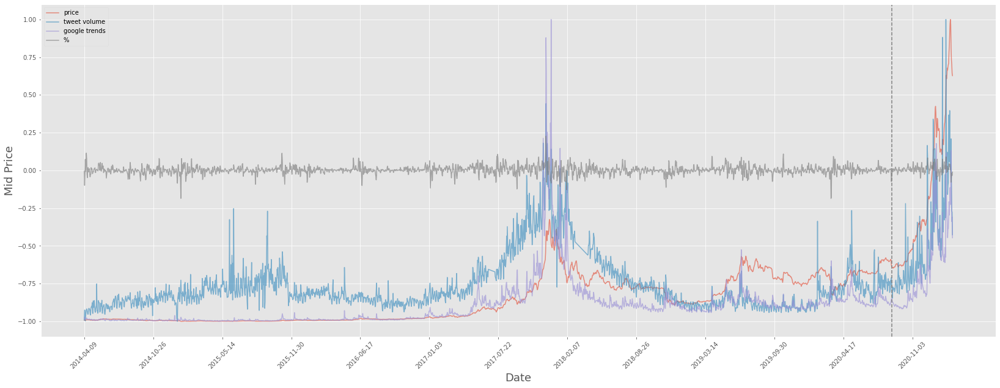

<module 'matplotlib.pyplot' from 'C:\\Users\\jgmu6\\AppData\\Local\\Programs\\Python\\Python38\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [6]:
from data.visualization import plot_data
plot_data([prices, tweet, google_trends, variation], 
          legends=['price', 'tweet volume', 'google trends', '%'], tick=200,
          verticalLineAt=len(prices)*0.93, labels=df.index.date[::200], blocking=False)

## Preparando os dados

transformando os dados para o formato de entrada do modelo

A entrada tem o formato (_n_samples_, _n_lookback, _n_features_), enquanto a saída tem o formato (_n_samples_, 2).

A saída tem 2 valores para cada amosta pelo seguinte motivo: uma função loss personalizada é usada, e tal função precisa do valor da saída do passo/timestep anterior, como uma "label auxiliar" <br/>
Então cada label de amostra, de formato (1, 2), tem no **primeiro valor** o resultado verdadeiro do **passo anterior**, e no **segundo valor** o resultado esperado do **atual passo**, isto é, da amostra a qual era corresponde.


In [7]:
from typing import Tuple
# look_behind: passos (dias) anteriores usados para prever o proximo.
N = 15
foward_days = 1  # quantos dias prever
used_features_names = ['price', 'variation', 'volume']
features = [prices, variation, volume, volume_variation] #+ event_votes_features + event_confidence_features
target = prices

def to_keras_format(features: list, target) -> Tuple[np.array, np.array]:
    n_samples = len(target) - N - (foward_days-1)
    # matriz de dimensao: [n_samples, N, n_features];
    features_set = np.empty((n_samples, N, len(features)))  # type: np.ndarray
    labels = [None]*n_samples
    for i in range(n_samples):
        for j in range(N):
            for ft_idx in range(len(features)):
                feature = features[ft_idx]
                features_set[i, j, ft_idx] = feature[i+j]

        labels[i] = target[N+i-1: N+i+foward_days]
    labels = np.array(labels)

    return features_set, labels

features_set, labels = to_keras_format(features, target)
print(features_set.shape, labels.shape)
print(f'ultimo valor em cada amostra:\n{features_set[:3, -1, 0:1]}\n...')
print(f'label auxiliar, label verdadeira:\n{labels[:3]}\n...')

(2502, 15, 4) (2502, 2)
ultimo valor em cada amostra:
[[-0.98952638]
 [-0.98932098]
 [-0.98984656]]
...
label auxiliar, label verdadeira:
[[-0.98952638 -0.98932098]
 [-0.98932098 -0.98984656]
 [-0.98984656 -0.99057487]]
...


In [8]:
from data.utils import split_data
print('dividindo os dados em treino e teste')
# shuffle_mask = np.arange(len(features_set))
# np.random.shuffle(shuffle_mask)
# features_set_shuffled, labels_shuffled = features_set[shuffle_mask], labels[shuffle_mask]

train_X, test_X = split_data(features_set, ratio=0.90)
train_y, test_y = split_data(labels, ratio=0.90)

print(f'train_X and test_X shape = {train_X.shape} {test_X.shape}')
print(f'train_y and test_y shape = {train_y.shape} {test_y.shape}')

dividindo os dados em treino e teste
train_X and test_X shape = (2251, 15, 4) (251, 15, 4)
train_y and test_y shape = (2251, 2) (251, 2)


# Construindo o modelo

In [9]:
from keras.models import Model
from keras.layers import Input, LSTM, Dropout, Dense

def build_model(train_X, train_y) -> Model:
    inputs = Input(shape=train_X.shape[1:])
    # lstm = LSTM(units=250, return_sequences=True, input_shape=train_X.shape[1:])(inputs)
    # lstm = Dropout(0.15)(lstm)

    lstm = LSTM(units=750, return_sequences=False, input_shape=train_X.shape[1:])(inputs)
    lstm = Dropout(0.15)(lstm)
    x = lstm
    # time_embedding = TimeDistributed(Time2Vec(kernel_size=1))(lstm)
    # x = concatenate([lstm, time_embedding], -1)

    # x = tf_MultiHeadAttention(num_heads=4, head_size=96,output_size=250,  dropout=0.15)((x,x))
    # x = LayerNormalization(epsilon=1e-6)(Add()([lstm,x]))
    # x = Conv1D(filters=128, kernel_size=1, activation='relu')(x)
    # x = LayerNormalization(epsilon=1e-6)(Add()([lstm,x]))

    # avg_pool = GlobalAveragePooling1D()(x)
    # x = GlobalMaxPooling1D()(lstm)
    # x = concatenate([avg_pool, max_pool])

    x = Dense(units=175, activation='linear')(x)
    x = Dropout(0.15)(x)
    x = Dense(units=75, activation='linear')(x)
    x = Dropout(0.15)(x)
    x = Dense(units=foward_days)(x)
    return Model(inputs=inputs, outputs=x)
    

modelo = build_model(train_X, train_y)

from keras.losses import mean_squared_error as keras_mean_squared_error, cosine_similarity as keras_cosine_similarity
from metrics.custom import custom_loss2, custom_loss, custom_movement_accuracy, above_or_below_zero_accuracy, movement_accuracy
from metrics.custom import mean_squared_error, cosine_similarity as custom_cosine_similarity


opt = tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=False)
modelo.compile(optimizer=opt, loss=mean_squared_error, metrics=[mean_squared_error, movement_accuracy])# 'cosine_similarity', 'mean_squared_error'

modelo.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 15, 4)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 750)               2265000   
_________________________________________________________________
dropout (Dropout)            (None, 750)               0         
_________________________________________________________________
dense (Dense)                (None, 175)               131425    
_________________________________________________________________
dropout_1 (Dropout)          (None, 175)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 75)                13200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 75)                0     

## treinando o modelo

In [10]:
modelo.fit(train_X, train_y, validation_data=(test_X, test_y), epochs=400, batch_size=128)  # validation_data=(test_X, test_y)
epochs = len(modelo.history.epoch)
print('Modelo treinado')

ccuracy: 0.4521
Epoch 317/400
18/18 [==============================] - 0s 24ms/step - loss: 5.4633e-04 - mean_squared_error: 5.4627e-04 - movement_accuracy: 0.5066 - val_loss: 6.8741e-04 - val_mean_squared_error: 7.0073e-04 - val_movement_accuracy: 0.5774
Epoch 318/400
18/18 [==============================] - 0s 23ms/step - loss: 4.6342e-04 - mean_squared_error: 4.6352e-04 - movement_accuracy: 0.5092 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_movement_accuracy: 0.6457
Epoch 319/400
18/18 [==============================] - 0s 24ms/step - loss: 5.3465e-04 - mean_squared_error: 5.3447e-04 - movement_accuracy: 0.5218 - val_loss: 8.3699e-04 - val_mean_squared_error: 8.5043e-04 - val_movement_accuracy: 0.6383
Epoch 320/400
18/18 [==============================] - 0s 23ms/step - loss: 4.6298e-04 - mean_squared_error: 4.6334e-04 - movement_accuracy: 0.5465 - val_loss: 7.1300e-04 - val_mean_squared_error: 7.2682e-04 - val_movement_accuracy: 0.5736
Epoch 321/400
18/18 [===========

In [10]:
from matplotlib import pyplot as plt
# vizualizando estatisticas do modelo em si e seu treino
def plot_train_history(modelo: Model, plot_above_or_below_zero_accuracy: bool):
    plt.rcParams['figure.figsize'] = (20,8)
    # plt.figure(figsize=(20, 8))
    plt.plot(modelo.history.history['loss'])
    plt.plot(modelo.history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show(block=True)

    plt.plot(modelo.history.history['mean_squared_error'])
    plt.plot(modelo.history.history['val_mean_squared_error'])
    plt.title('model meanSquaredError')
    plt.ylabel('mse')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show(block=True)

    plt.plot(modelo.history.history['movement_accuracy'])
    plt.plot(modelo.history.history['val_movement_accuracy'])
    plt.title('model movement direction accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show(block=True)

    # plote esse apenas se seu dado target for de variação (não faz sentido para dado bruto)
    if plot_above_or_below_zero_accuracy:
        plt.plot(modelo.history.history['above_or_below_zero_accuracy'])
        plt.plot(modelo.history.history['val_above_or_below_zero_accuracy'])
        plt.title('price up or down accuracy *')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show(block=True)

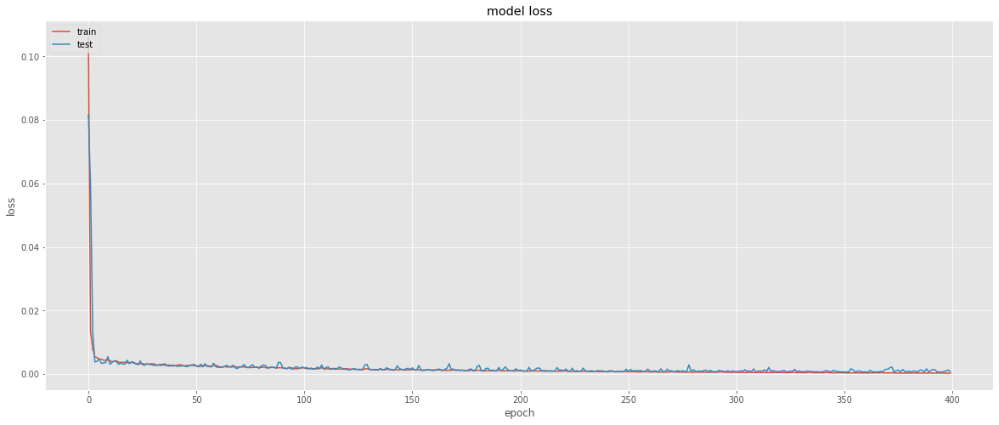

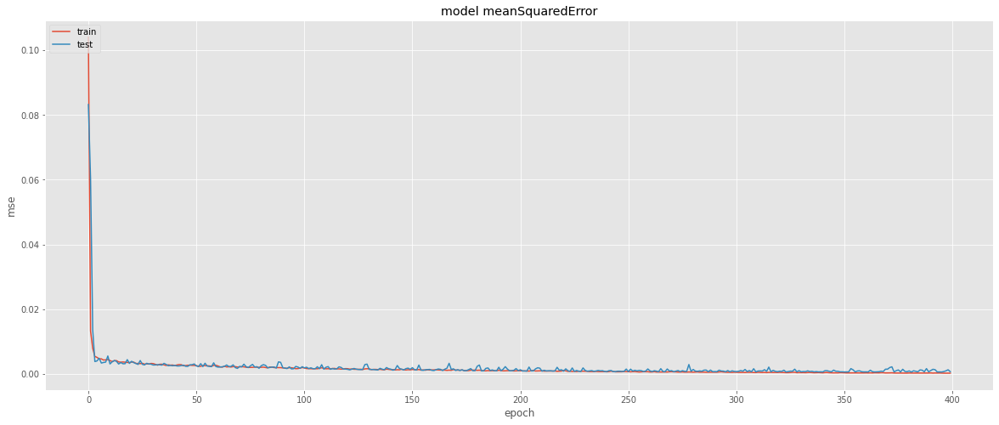

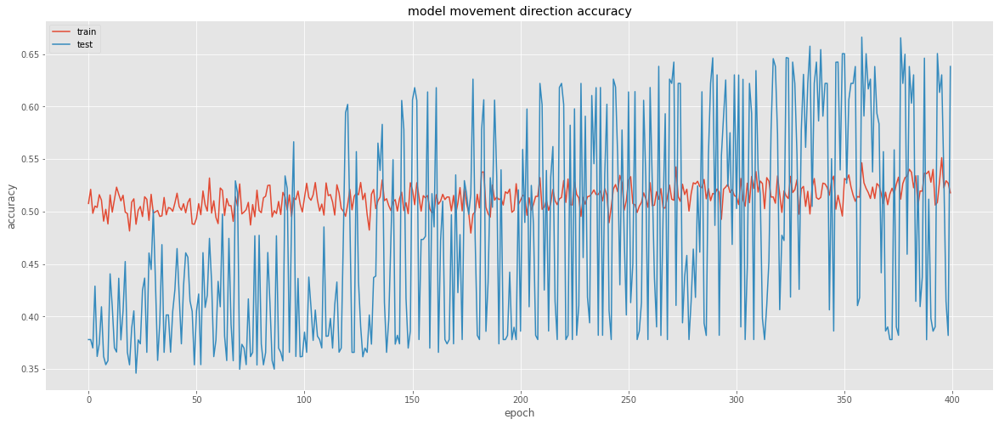

In [11]:
plot_train_history(modelo, plot_above_or_below_zero_accuracy=False)

## resultados

In [12]:
# PREVISAAAAOOO
from keras.losses import mean_squared_error as keras_mean_squared_error, cosine_similarity as keras_cosine_similarity

train_score = modelo.evaluate(x=train_X, y=train_y, batch_size=16)
test_score = modelo.evaluate(x=test_X, y=test_y, batch_size=16)
print('Train Score:', train_score)
print('Test Score:', test_score)
#predictions = scaler.inverse_transform(predictions)

#timestep_size = 1./len(features_set)
testPredict = modelo.predict(test_X)

timestep_size = 0.1
original_vectors = [[timestep_size, test_y[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
prediction_vectors = [[timestep_size, testPredict[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
cos_similarity = np.mean(keras_cosine_similarity(original_vectors, prediction_vectors))
print('Cosine similarity %s' % cos_similarity)
mse = mean_squared_error(test_y, testPredict).numpy()
print('Mean Square Error %s' % mse)
upDownScore = movement_accuracy(test_y, testPredict).numpy()
print('Movement accuracy %s' % upDownScore)

'''por algum motivo, mesmo sendo a mesma função, quando eu calculo manualmente dá resultados levemente diferentes 
do evaluate() (talvez por causa do tamanho do batch ?)
'''

16/16 [==============================] - 0s 6ms/step - loss: 7.2698e-04 - mean_squared_error: 8.0607e-04 - movement_accuracy: 0.6374
Train Score: [8.763637742958963e-05, 8.764780795900151e-05, 0.5562137365341187]
Test Score: [0.0007269821944646537, 0.0008060706313699484, 0.6374289989471436]
Cosine similarity -0.9745566
Mean Square Error 0.00072698196
Movement accuracy 0.6374502


'por algum motivo, mesmo sendo a mesma função, quando eu calculo manualmente dá resultados levemente diferentes \ndo evaluate() (talvez por causa do tamanho do batch ?)\n'

## visualizando resultados

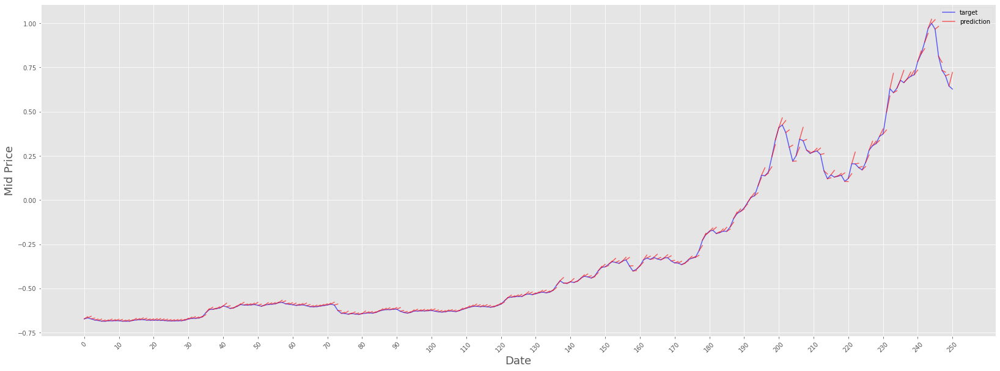

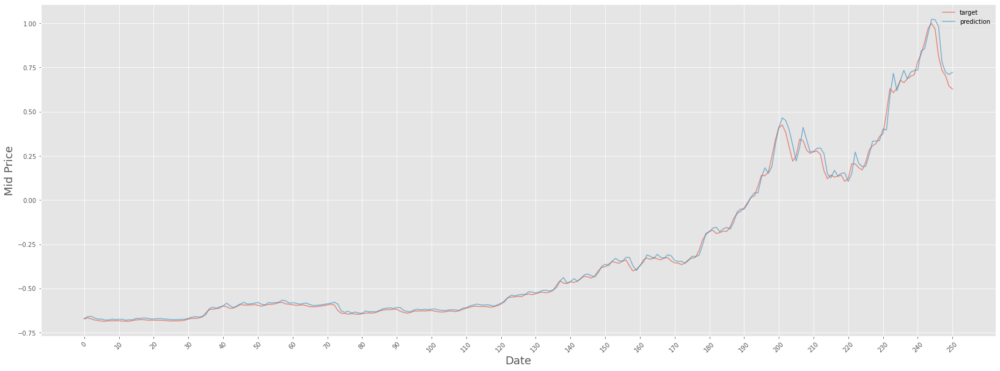

In [13]:
predictions = testPredict
targets_test = test_y[:, -1:].tolist()
# prediction tem um shape (samples, foward_days), entao vamos pegar previsoes de foward_days dias, a cada partir de pontos com intervalo de foward_days
foward_days_predictions = []
for i in range(1, predictions.shape[0], foward_days):
    foward_days_predictions.append(np.array([None]*(i-1) + targets_test[i-1] +
                                            predictions[i].tolist() +
                                            [None]*(predictions.shape[0]-(i+foward_days))))


fig = plot_data([targets_test] + foward_days_predictions, tick=10, legends=['target', 'prediction'],
                colors=['b', 'r'] + ['r']*len(foward_days_predictions), blocking=False)
# 1 day predictions
fig = plot_data([targets_test, predictions[:, 0]], tick=10, legends=['target', 'prediction'], blocking=False)

# Fazendo o mesmo, mas agora prevendo a variação, ao invés do preço

In [14]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation] #+ event_features
target = variation

features_set, labels = to_keras_format(features, target)
train_X, test_X = split_data(features_set, ratio=0.85)
train_y, test_y = split_data(labels, ratio=0.85)


modelo = build_model(train_X, train_y)

opt = tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=True)
modelo.compile(optimizer=opt, loss=mean_squared_error, metrics=[mean_squared_error, movement_accuracy, above_or_below_zero_accuracy])# 'cosine_similarity', 'mean_squared_error'
modelo.fit(train_X, train_y, validation_data=(test_X, test_y), epochs=160, batch_size=16)  # validation_data=(test_X, test_y)



 - mean_squared_error: 4.5722e-04 - movement_accuracy: 0.6995 - above_or_below_zero_accuracy: 0.7273 - val_loss: 4.9817e-04 - val_mean_squared_error: 4.9994e-04 - val_movement_accuracy: 0.7031 - val_above_or_below_zero_accuracy: 0.6771
Epoch 100/160
133/133 [==============================] - 2s 15ms/step - loss: 4.0502e-04 - mean_squared_error: 4.0502e-04 - movement_accuracy: 0.7016 - above_or_below_zero_accuracy: 0.7198 - val_loss: 4.6187e-04 - val_mean_squared_error: 4.6632e-04 - val_movement_accuracy: 0.7240 - val_above_or_below_zero_accuracy: 0.7266
Epoch 101/160
133/133 [==============================] - 2s 15ms/step - loss: 3.7470e-04 - mean_squared_error: 3.7471e-04 - movement_accuracy: 0.7262 - above_or_below_zero_accuracy: 0.7204 - val_loss: 4.9239e-04 - val_mean_squared_error: 4.9611e-04 - val_movement_accuracy: 0.7031 - val_above_or_below_zero_accuracy: 0.7448
Epoch 102/160
133/133 [==============================] - 2s 15ms/step - loss: 3.9033e-04 - mean_squared_error: 3.903

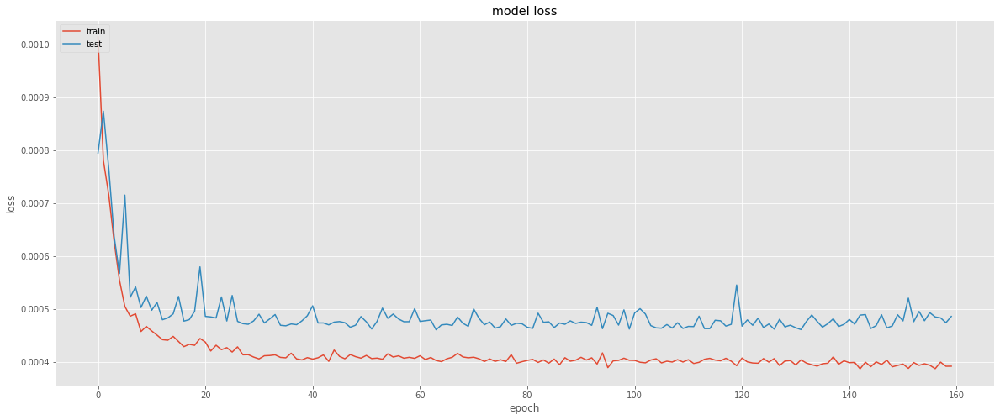

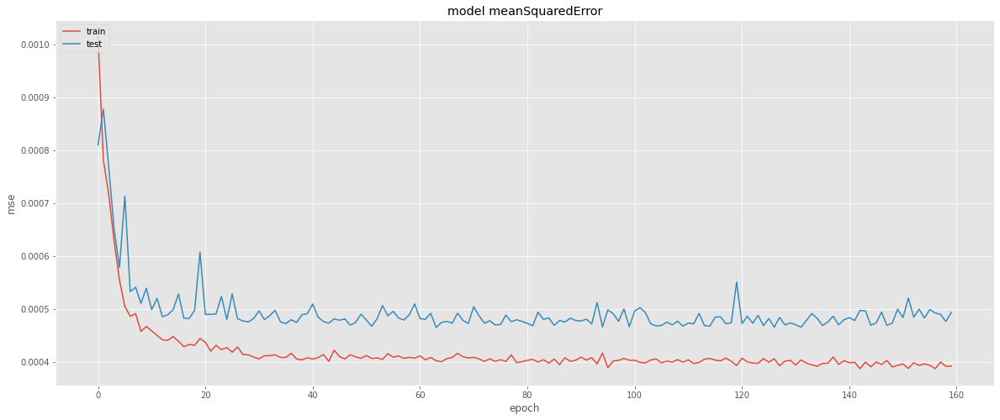

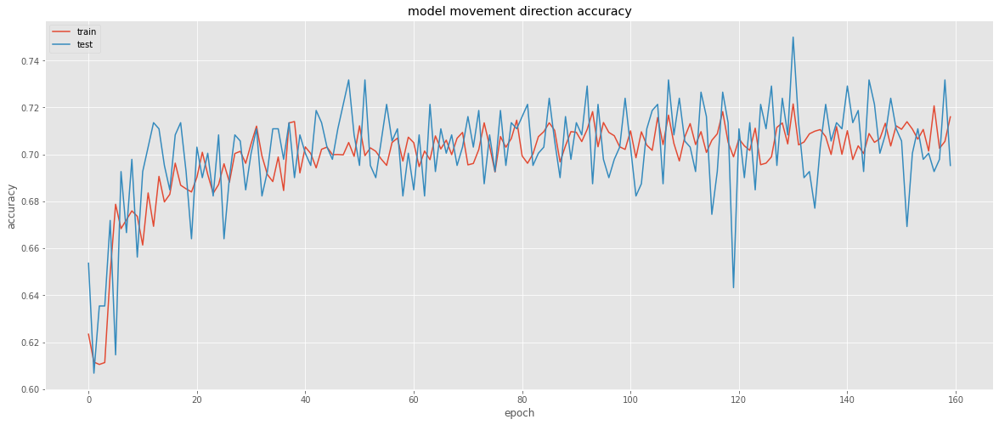

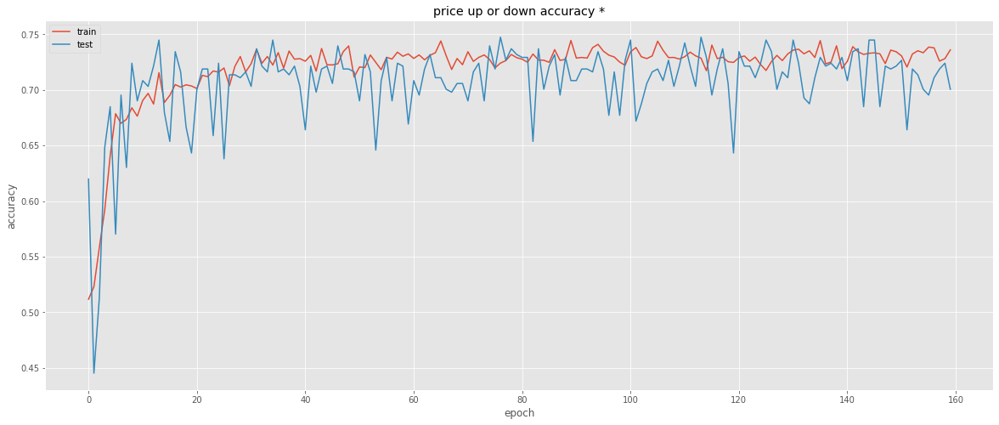

In [15]:
plot_train_history(modelo, plot_above_or_below_zero_accuracy=True)

In [16]:
# train_score = modelo.evaluate(x=train_X, y=train_y, batch_size=1)
test_score = modelo.evaluate(x=test_X, y=test_y, batch_size=1)

testPredict = modelo.predict(test_X)

timestep_size = 0.1
original_vectors = [[timestep_size, test_y[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
prediction_vectors = [[timestep_size, testPredict[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
cos_similarity = np.mean(keras_cosine_similarity(original_vectors, prediction_vectors))
print('Cosine similarity %s' % cos_similarity)
mse = mean_squared_error(test_y, testPredict).numpy()
print('Mean Square Error %s' % mse)
upDownScore = movement_accuracy(test_y, testPredict).numpy()
print('Movement accuracy %s' % upDownScore)
above_below_zero = above_or_below_zero_accuracy(test_y, testPredict).numpy()
print('Price up or down accuracy (só é relevante para regressao de porcentagem, não valores brutos): %s' % above_below_zero)

print('Agora que usamos o batch de tamanho 1, temos um resultado semelhante ao calculo manual. Teoria foi confirmada')

376/376 [==============================] - 3s 6ms/step - loss: 4.8579e-04 - mean_squared_error: 4.8579e-04 - movement_accuracy: 0.6915 - above_or_below_zero_accuracy: 0.6995
Cosine similarity -0.98190594
Mean Square Error 0.00048578565
Movement accuracy 0.69148934
Price up or down accuracy (só é relevante para regressao de porcentagem, não valores brutos): 0.6994681
Agora que usamos o batch de tamanho 1, temos um resultado semelhante ao calculo manual. Teoria foi confirmada


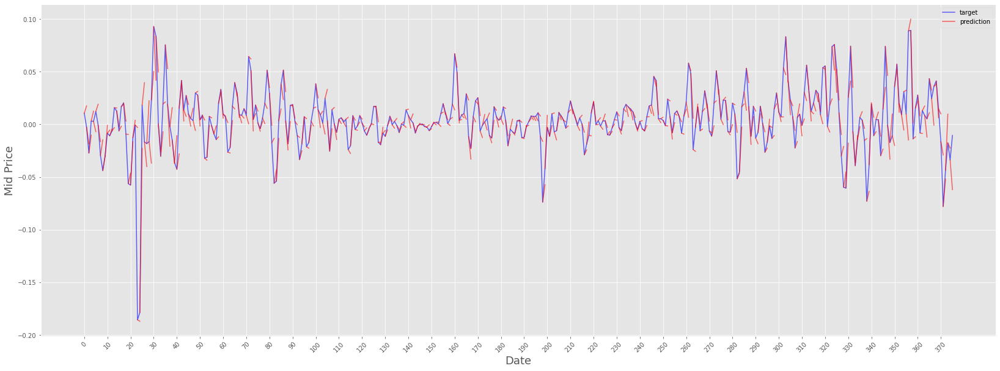

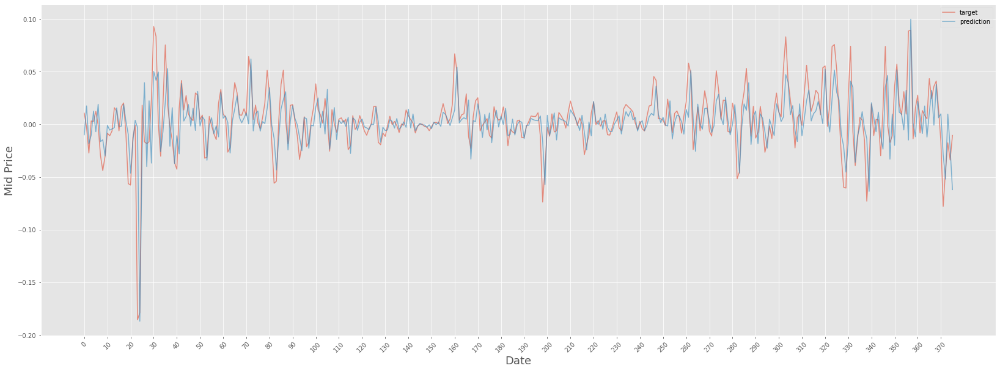

In [17]:
predictions = testPredict
targets_test = test_y[:, -1:].tolist()
# prediction tem um shape (samples, foward_days), entao vamos pegar previsoes de foward_days dias, a cada partir de pontos com intervalo de foward_days
foward_days_predictions = []
for i in range(1, predictions.shape[0], foward_days):
    foward_days_predictions.append(np.array([None]*(i-1) + targets_test[i-1] +
                                            predictions[i].tolist() +
                                            [None]*(predictions.shape[0]-(i+foward_days))))


fig = plot_data([targets_test] + foward_days_predictions, tick=10, legends=['target', 'prediction'],
                colors=['b', 'r'] + ['r']*len(foward_days_predictions), blocking=False)
# 1 day predictions
fig = plot_data([targets_test, predictions[:, 0]], tick=10, legends=['target', 'prediction'], blocking=False)

Como podemos ver, ao tentar prever a variação ao invés do valor bruto, temos resultados melhores.<br/>
Isso acontece devido o escopo de dados ser mais consistente, e consequentemente o modelo não ter que lidar com valores nunca visto antes. Sendo assim, o modelo também será à prova "do futuro"

# Função loss personalizada

Agora vamos comparar o modelo usando a função loss personalizada contra a mais comunente usada `meanSquaredError`.

A função já foi definida em [metrics/custom.py](metrics/custom.py), mas iremos defini-la passo a passo novamente aqui para fins didáticos:

O objetivo desta função loss personalizada é dar valor para a angulação do movimento também, ao invés de apenas a diferença entre o valor esperado e previsto.<br/>
A função, para isso, utiliza a similaridade por cosseno.

na biblioteca _Keras_ sua implementação dá uma saída no intervalo \[-1, 1\], onde quando é um numero negativo entre -1 e 0, 0 indica ortogonalidade e valores mais proximos de -1 indicam maior similaridade. Valores mais proximos a 1 indicam maior dissimilaridade. Por exemplo:

In [18]:
from keras.losses import cosine_similarity as keras_cosine_similarity
# considera-se que os vetores saem da origem
y_true = [[0., 1.], [1., 1.]]
y_pred = [[1., 0.], [1., 1.]]

keras_cosine_similarity(y_true, y_pred, axis=1).numpy()

array([-0.        , -0.99999994], dtype=float32)

Sendo assim, a versão preguiçosa da nossa função loss seria:<br/>
`SquaredError(y_true, y_pred) * CosineSimilarity(y_true, y_pred)`

mas antes devemos tratar de alguns pontos:
 - A similaridade por cosseno lê e compara dois vetores, então devemos antes transformar o y_true e y_pred em vetores que saem da origem;
 - Para isso, precisamos do valor _Y_ e _X_ do vetor, e consequentemente a distância de _Y_, _X_ atuais dos _Y_, _X_ do timestep anterior
 - _Y_ pode ser obtido com a diferença entre o _Y_ atual e o _Y_ do timestep anterior__*__
 - Porém, nossos dados não tem noção de distância entre um timestep e outro (um dia e outro), apenas sabem que um timestep se passou,<br/>
 em outras palavras: não sabemos o valor de _X_


##### *: por isso, durante a preparação de dados, as labels possuem dois valores (valor anterior e atual), ao invés de um único (valor atual)




Então optei por escolher um valor arbitrário, que se adequasse no escopo de valores de y.
Por exemplo, podemos ver que nossos dados da feature _variação (%)_ normalmente variam entre 0.07 e -0.05, e em casos mais extremos entre 0.15 e -0.15,<br/>
então decidi que x=0.1, pois os angulos dos vetores resultantes normalmente ficariam perto mas abaixo de 45°.

A implementação da _similaridade por cosseno_ fica assim: 
 ##### note que _y_true_ tem dois valores (_label_ anterior e atual), mas _y_pred_ apenas um (predição atual), pois não precisamos da predição anterior (a _label_ anterior é usada no lugar).

In [19]:
from keras.losses import cosine_similarity as keras_cosine_similarity

# y_true.shape = (batch_size, 2)
# y_pred.shape =  (batch_size, 1)

def cosine_similarity_didatico(y_true, y_pred):
    print(f'\ny_true:{y_true}\ny_pred:{y_pred}')

    y_true_firstColumn = y_true[:, :1]  #label do timestep anterior
    y_pred = tf.concat([y_true[:, :1], y_pred], axis=-1)    # junta o valor (label) anterior com a previsao atual
    print(f'\ny_true:{y_true}\ny_pred:{y_pred}')

    y_pred = y_pred - y_true_firstColumn + [0.1, 0]       # move o vetor para sair da origem, e faz eixo x = 0.1
    y_true = y_true - y_true_firstColumn + [0.1, 0]
    print(f'\nagora são vetores saindo da origem,\ny_true:{y_true}\ny_pred:{y_pred}')    # vetores gerados

    return keras_cosine_similarity(y_true, y_pred, axis=-1)  # função de similaridade por cosseno padrão

#exemplo
y_true = [[.0,.01],
          [.01, .06],
          [.06, .09],
          [.09, -.05],
          [-.05, -.02]]
y_pred = [[.01],
          [.04],
          [.05],
          [.03],
          [-.01]]
y_true, y_pred = np.array(y_true), np.array(y_pred)
y_true, y_pred = tf.convert_to_tensor(y_true), tf.convert_to_tensor(y_pred)

print('similaridade por coseno: ', cosine_similarity_didatico(y_true, y_pred))


y_true:[[ 0.    0.01]
 [ 0.01  0.06]
 [ 0.06  0.09]
 [ 0.09 -0.05]
 [-0.05 -0.02]]
y_pred:[[ 0.01]
 [ 0.04]
 [ 0.05]
 [ 0.03]
 [-0.01]]

y_true:[[ 0.    0.01]
 [ 0.01  0.06]
 [ 0.06  0.09]
 [ 0.09 -0.05]
 [-0.05 -0.02]]
y_pred:[[ 0.    0.01]
 [ 0.01  0.04]
 [ 0.06  0.05]
 [ 0.09  0.03]
 [-0.05 -0.01]]

agora são vetores saindo da origem,
y_true:[[ 0.1   0.01]
 [ 0.1   0.05]
 [ 0.1   0.03]
 [ 0.1  -0.14]
 [ 0.1   0.03]]
y_pred:[[ 0.1   0.01]
 [ 0.1   0.03]
 [ 0.1  -0.01]
 [ 0.1  -0.06]
 [ 0.1   0.04]]
similaridade por coseno:  tf.Tensor([-1.         -0.98521175 -0.92448059 -0.91707006 -0.99603771], shape=(5,), dtype=float64)


Agora que conseguimos calcular a similaridade por cosseno, podemos implementar a função de _loss_

In [20]:
from tensorflow.python.framework import ops
from tensorflow.python.ops import math_ops
def square_error_didatico(y_true, y_pred): #implementação igual da biblioteca keras, mas adaptada para o nosso formato de y_true
    y_pred = ops.convert_to_tensor_v2_with_dispatch(y_pred)
    y_true = math_ops.cast(y_true[:, 1:], y_pred.dtype)
    return math_ops.squared_difference(y_pred, y_true)

def custom_loss_didatico(y_true, y_pred):
    c = cosine_similarity_didatico(y_true, y_pred) #valores entre  -1 e 1 (na pratica entre -1 e 0)
    c = (c+1.) #entre  0 e 2 (na pratica 0 e 1)
    c = (c/2.)+1 #entre 1 e 2 (na pratica 1 e 1.5)
    error = tf.reduce_mean(square_error_didatico(y_true, y_pred))

    return error * (tf.reduce_mean(c)**2)

a função cosine_similarity retorna um valor entre -1 e 1, então para não incentivar o aumento de MeanSquaredError (que varia de 0 a 1) quando houver "acertos de direção/angulo", vamos mudar o intervalo de -1 a 1 para  0 a 2.

mas como todos os valores de x são iguais, então o intervalo na pratica é entre -1 e 0, e 0 e 1 depois da conversão.

Também, observou-se que maioria dos valores estão proximos de -1 (0 na pratica), <br/>
então multiplica por um valor arbitrário $\alpha$ (nesse caso $\alpha$ = 0.5) para aumentar o range dos valores, deixando o intervalo entre 0 e 2$\alpha$ (0 e $\alpha$ na pratica)<br/>
e soma 1, para tornar a diferença de angulação/movimento uma penalizadora (ao invés de recompensadora), deixando o intervalo entre 1 e 3$\alpha$ (1 e 1+$\alpha$ na pratica)

Por fim, também pelo motivo dos valores originalmente serem muito proximos de -1, após estender o range de valores multiplicando por $\alpha$, o valor é elevado ao quadrado*, para captar melhor as grandes diferenças de movimento/angulação.
##### *: mesma lógica do MeanSquaredError vs MeanAbsoluteError


opcional: Também podemos substituir o `MeanSquaredError` pelo `LogCosh`, que se comporta como o `MeanSquaredError` para valores pequenos, mas não penaliza tanto como ele para valores grandes.
##### faz sentido fazer isso, pois no final das contas estamos tirando penalização do erro (diferenca entre valores), e passando para a angulação/movimento.

In [21]:
from keras.losses import log_cosh
def custom_loss_didatico(y_true, y_pred):
    c = cosine_similarity_didatico(y_true, y_pred) #valores entre  -1 e 1 (na pratica entre -1 e 0)
    c = (c+1.) #entre  0 e 2 (na pratica 0 e 1)
    c = (c*4)+2 #entre 2 e 10 (na pratica 2 e 6)
    error = log_cosh(y_true[:, 1:], y_pred)

    return error * (tf.reduce_mean(c)**2) 

# Comparando MeanSquaredError com função loss personalizada

20 epochs foi o valor escolhido, pois depois de 10 nao se tem muito mais ganho, e depois de 20 nao se tem nenhum ganho ou então piora (overfitting intenso?).

In [11]:
# tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

from metrics.custom import above_or_below_zero_accuracy, movement_accuracy
from metrics.custom import mean_squared_error, cosine_similarity as custom_cosine_similarity


def build_and_run_and_show(features, target, loss_function, epochs=600, batch_size=128) -> Model:
    features_set, labels = to_keras_format(features, target)

    shuffle_mask = np.arange(len(features_set))
    unshuffle_mask = np.zeros(len(features_set), dtype=int)
    np.random.shuffle(shuffle_mask)
    for i in range(len(shuffle_mask)):
        unshuffle_mask[shuffle_mask[i]] = i
    features_set, labels = features_set[shuffle_mask], labels[shuffle_mask]

    train_X, test_X = split_data(features_set, ratio=0.75)
    train_y, test_y = split_data(labels, ratio=0.75)


    model = build_model(train_X, train_y)

    opt = tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=True)
    model.compile(optimizer=opt, loss=loss_function, metrics=[mean_squared_error, movement_accuracy, above_or_below_zero_accuracy])# 'cosine_similarity', 'mean_squared_error'
    model.fit(train_X, train_y, validation_data=(test_X, test_y), epochs=epochs, batch_size=batch_size)  # validation_data=(test_X, test_y)

    plot_train_history(model, plot_above_or_below_zero_accuracy=True)

    test_score = model.evaluate(x=test_X, y=test_y, batch_size=1)
    testPredict = model.predict(test_X)

    # timestep_size = 0.1
    # original_vectors = [[timestep_size, test_y[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
    # prediction_vectors = [[timestep_size, testPredict[i, -1] - test_y[i-1, -1]] for i in range(1, len(test_y))]
    # cos_similarity = np.mean(keras_cosine_similarity(original_vectors, prediction_vectors))
    # print('Cosine similarity %s' % cos_similarity)
    mse = mean_squared_error(test_y, testPredict).numpy()
    print('Mean Square Error %s' % mse)
    upDownScore = movement_accuracy(test_y, testPredict).numpy()
    print('Movement accuracy %s' % upDownScore)
    above_below_zero = above_or_below_zero_accuracy(test_y, testPredict).numpy()
    print('Price up or down accuracy: %s' % above_below_zero)

    
    features_set, labels = features_set[unshuffle_mask], labels[unshuffle_mask]
    _, test_X = split_data(features_set, ratio=0.75)
    _, test_y = split_data(labels, ratio=0.75)
    predictions = model.predict(test_X)
    targets_test = test_y[:, -1:].tolist()
    # prediction tem um shape (samples, foward_days), entao vamos pegar previsoes de foward_days dias, a cada partir de pontos com intervalo de foward_days
    foward_days_predictions = []
    for i in range(1, predictions.shape[0], foward_days):
        foward_days_predictions.append(np.array([None]*(i-1) + targets_test[i-1] +
                                                predictions[i].tolist() +
                                                [None]*(predictions.shape[0]-(i+foward_days))))


    fig = plot_data([targets_test] + foward_days_predictions, tick=10, legends=['target', 'prediction'],
                    colors=['b', 'r'] + ['r']*len(foward_days_predictions), blocking=False)
    # 1 day predictions
    fig = plot_data([targets_test, predictions[:, 0]], tick=10, legends=['target', 'prediction'], blocking=False)

    return model

bove_or_below_zero_accuracy: 0.7021
Epoch 539/600
15/15 [==============================] - 0s 26ms/step - loss: 4.0934e-04 - mean_squared_error: 4.0934e-04 - movement_accuracy: 0.7120 - above_or_below_zero_accuracy: 0.7414 - val_loss: 3.9419e-04 - val_mean_squared_error: 3.9389e-04 - val_movement_accuracy: 0.7072 - val_above_or_below_zero_accuracy: 0.7196
Epoch 540/600
15/15 [==============================] - 0s 26ms/step - loss: 3.9219e-04 - mean_squared_error: 3.9216e-04 - movement_accuracy: 0.7118 - above_or_below_zero_accuracy: 0.7267 - val_loss: 3.9284e-04 - val_mean_squared_error: 3.9287e-04 - val_movement_accuracy: 0.7134 - val_above_or_below_zero_accuracy: 0.7229
Epoch 541/600
15/15 [==============================] - 0s 26ms/step - loss: 3.9456e-04 - mean_squared_error: 3.9449e-04 - movement_accuracy: 0.7152 - above_or_below_zero_accuracy: 0.7358 - val_loss: 3.9897e-04 - val_mean_squared_error: 3.9834e-04 - val_movement_accuracy: 0.7054 - val_above_or_below_zero_accuracy: 0.706

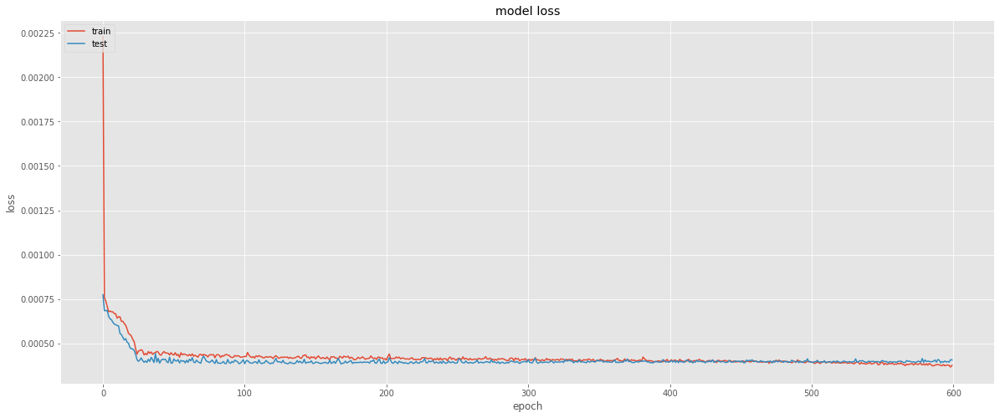

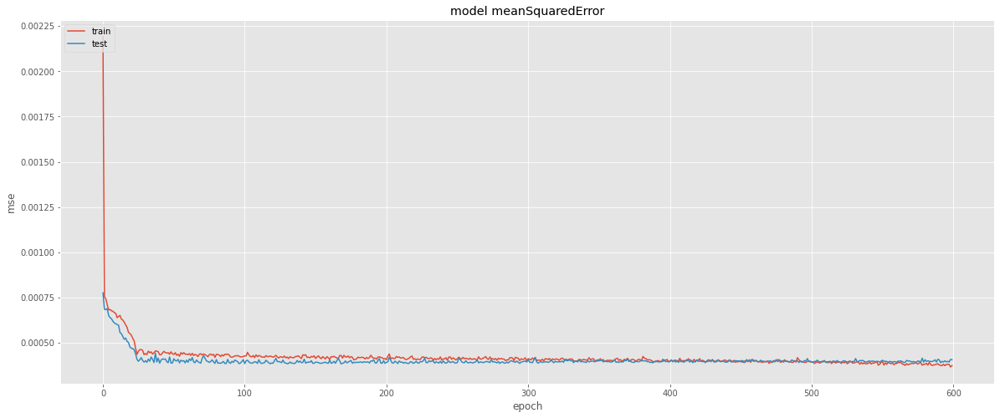

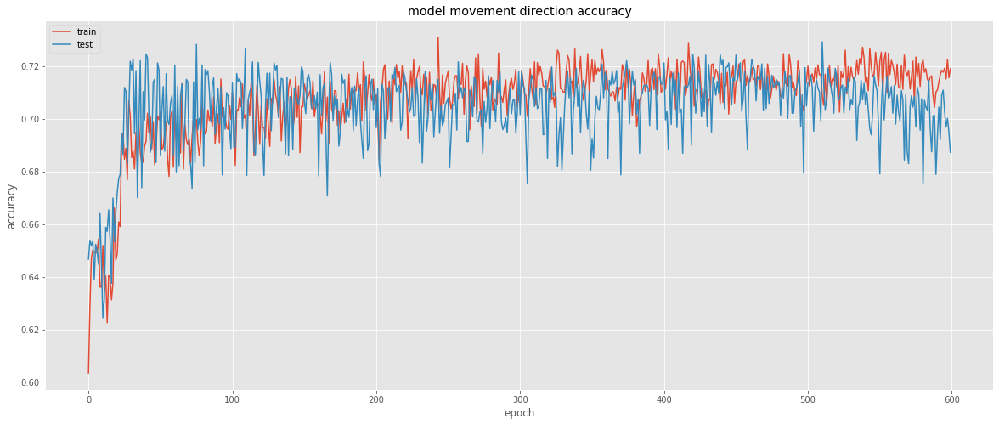

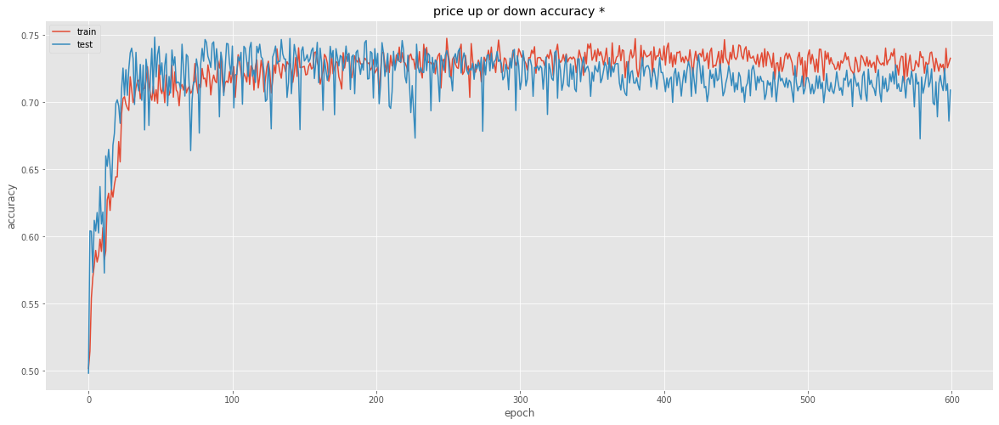

626/626 [==============================] - 4s 6ms/step - loss: 4.0657e-04 - mean_squared_error: 4.0657e-04 - movement_accuracy: 0.6869 - above_or_below_zero_accuracy: 0.7077
Mean Square Error 0.00040656776
Movement accuracy 0.686901
Price up or down accuracy: 0.7076677


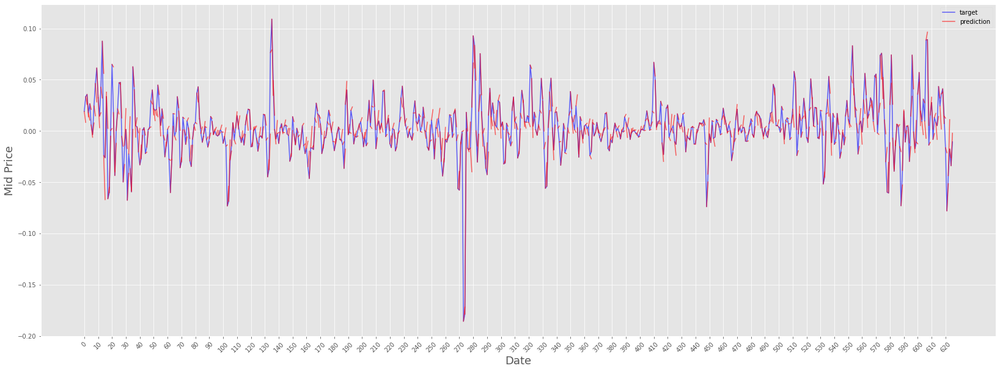

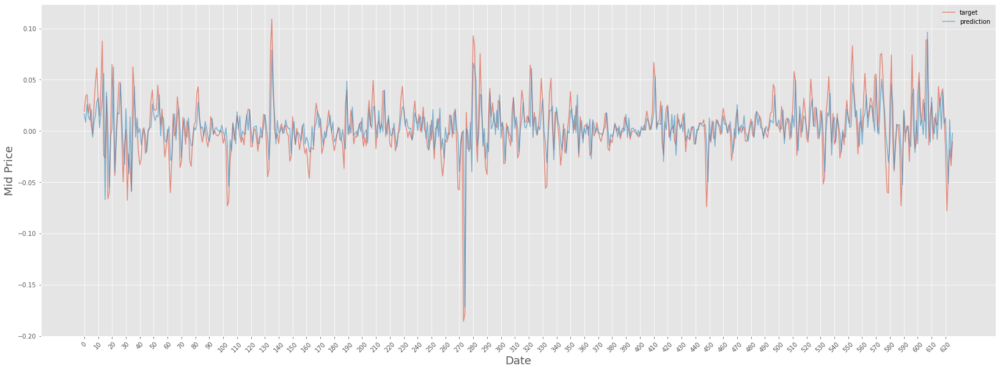

In [23]:
tf.keras.backend.clear_session()
features = [variation, volume_variation] #+ event_features
target = variation
model_mse = build_and_run_and_show(features, target, mean_squared_error)

bove_or_below_zero_accuracy: 0.7618
Epoch 539/600
15/15 [==============================] - 0s 32ms/step - loss: 4.3969e-04 - mean_squared_error: 4.3594e-04 - movement_accuracy: 0.7283 - above_or_below_zero_accuracy: 0.7417 - val_loss: 3.0845e-04 - val_mean_squared_error: 3.0675e-04 - val_movement_accuracy: 0.7239 - val_above_or_below_zero_accuracy: 0.7399
Epoch 540/600
15/15 [==============================] - 0s 32ms/step - loss: 3.6839e-04 - mean_squared_error: 3.6567e-04 - movement_accuracy: 0.7076 - above_or_below_zero_accuracy: 0.7270 - val_loss: 3.0930e-04 - val_mean_squared_error: 3.0716e-04 - val_movement_accuracy: 0.7153 - val_above_or_below_zero_accuracy: 0.7643
Epoch 541/600
15/15 [==============================] - 0s 31ms/step - loss: 3.8800e-04 - mean_squared_error: 3.8524e-04 - movement_accuracy: 0.7261 - above_or_below_zero_accuracy: 0.7362 - val_loss: 3.0397e-04 - val_mean_squared_error: 3.0234e-04 - val_movement_accuracy: 0.7181 - val_above_or_below_zero_accuracy: 0.756

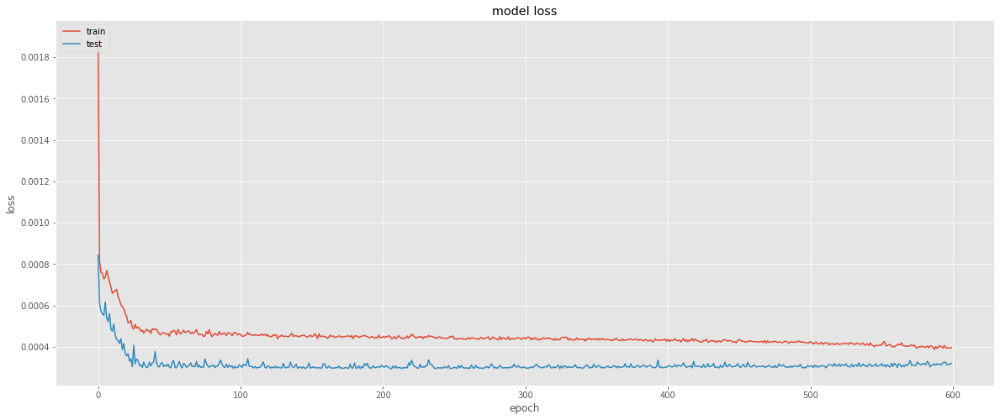

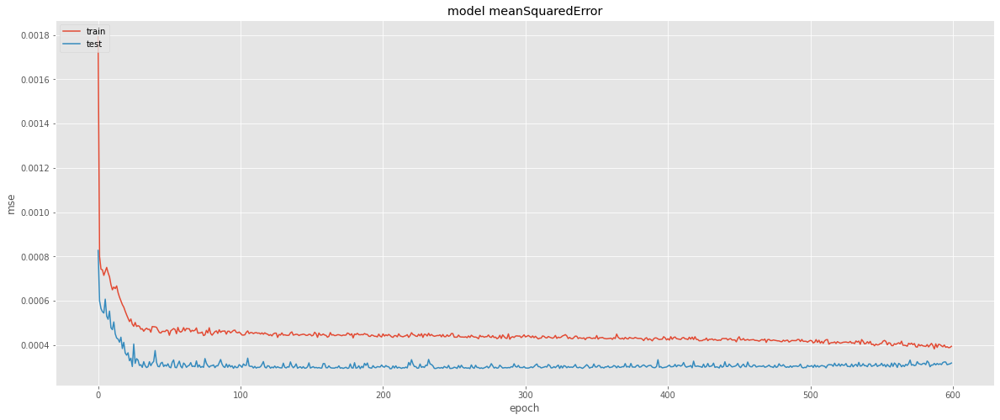

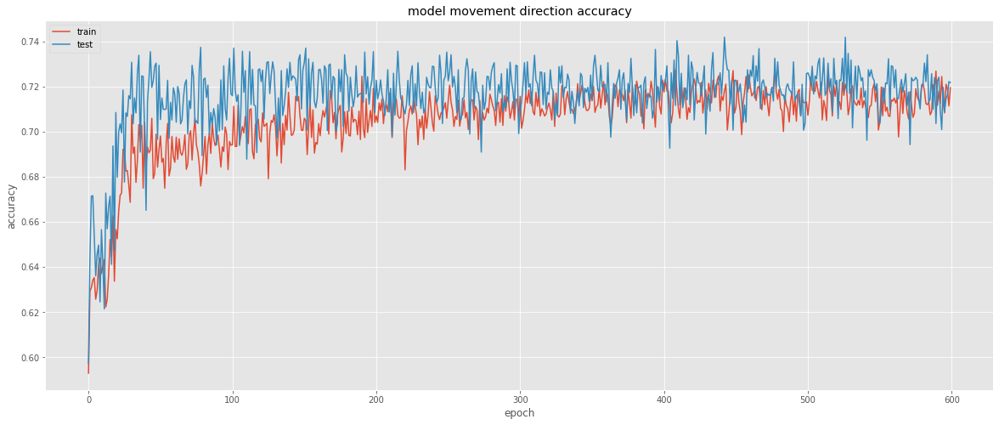

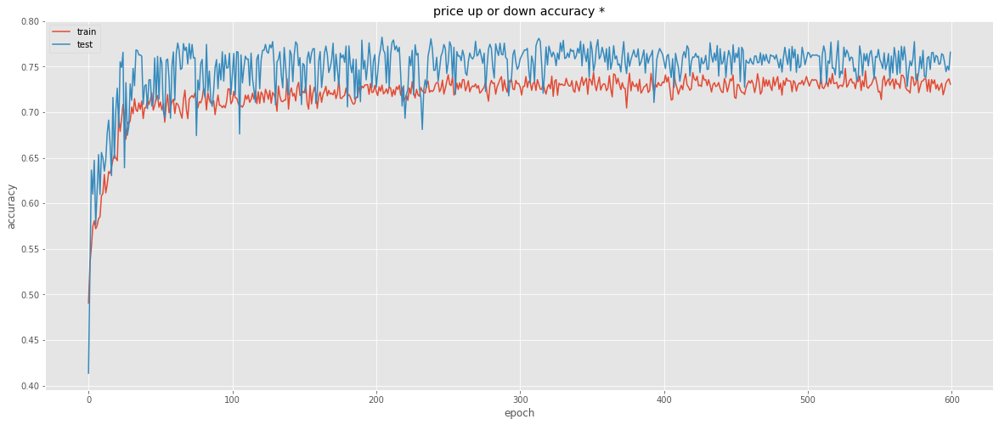

626/626 [==============================] - 5s 7ms/step - loss: 3.3161e-04 - mean_squared_error: 3.1874e-04 - movement_accuracy: 0.7220 - above_or_below_zero_accuracy: 0.7652
Mean Square Error 0.00031873886
Movement accuracy 0.7220447
Price up or down accuracy: 0.7651757


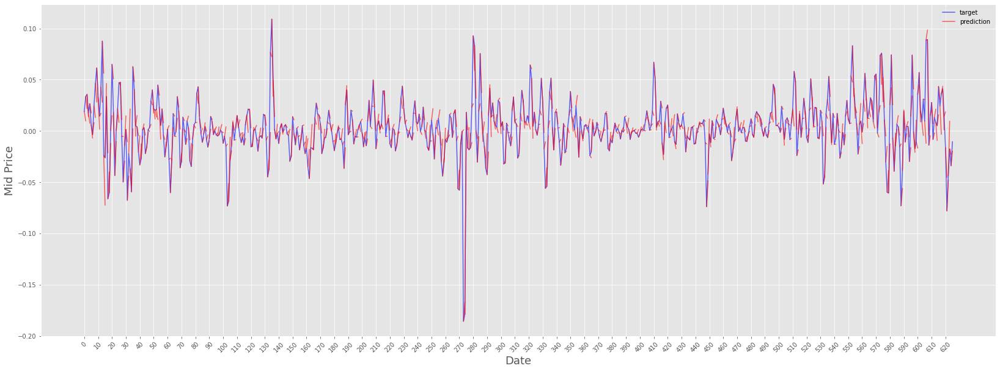

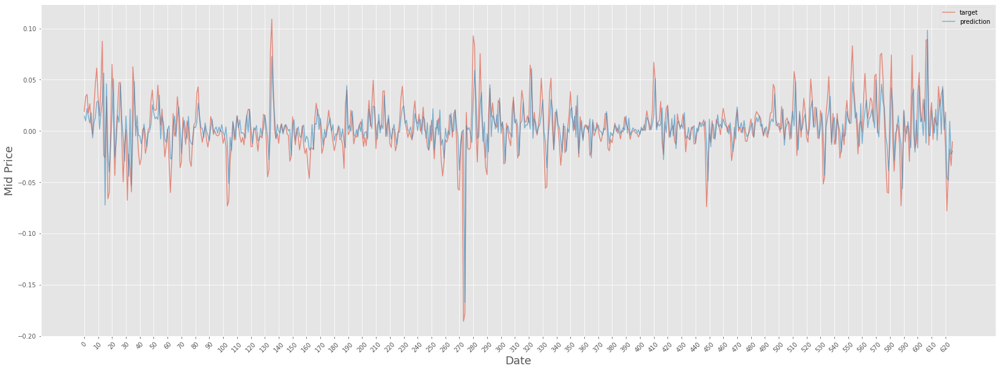

In [18]:
tf.keras.backend.clear_session()
from metrics.custom import custom_loss2, custom_loss, custom_movement_accuracy

features = [variation, volume_variation] #+ event_features
target = variation
model_custom = build_and_run_and_show(features, target, custom_loss)


# Comparando adição de novas features

bove_or_below_zero_accuracy: 0.6708
Epoch 739/800
15/15 [==============================] - 0s 30ms/step - loss: 9.9562e-05 - mean_squared_error: 9.9655e-05 - movement_accuracy: 0.8424 - above_or_below_zero_accuracy: 0.8399 - val_loss: 7.6811e-04 - val_mean_squared_error: 7.6804e-04 - val_movement_accuracy: 0.6236 - val_above_or_below_zero_accuracy: 0.6757
Epoch 740/800
15/15 [==============================] - 0s 30ms/step - loss: 1.0164e-04 - mean_squared_error: 1.0166e-04 - movement_accuracy: 0.8280 - above_or_below_zero_accuracy: 0.8104 - val_loss: 7.4209e-04 - val_mean_squared_error: 7.4246e-04 - val_movement_accuracy: 0.6523 - val_above_or_below_zero_accuracy: 0.6692
Epoch 741/800
15/15 [==============================] - 0s 29ms/step - loss: 1.0637e-04 - mean_squared_error: 1.0632e-04 - movement_accuracy: 0.8212 - above_or_below_zero_accuracy: 0.8258 - val_loss: 7.8165e-04 - val_mean_squared_error: 7.8070e-04 - val_movement_accuracy: 0.6515 - val_above_or_below_zero_accuracy: 0.684

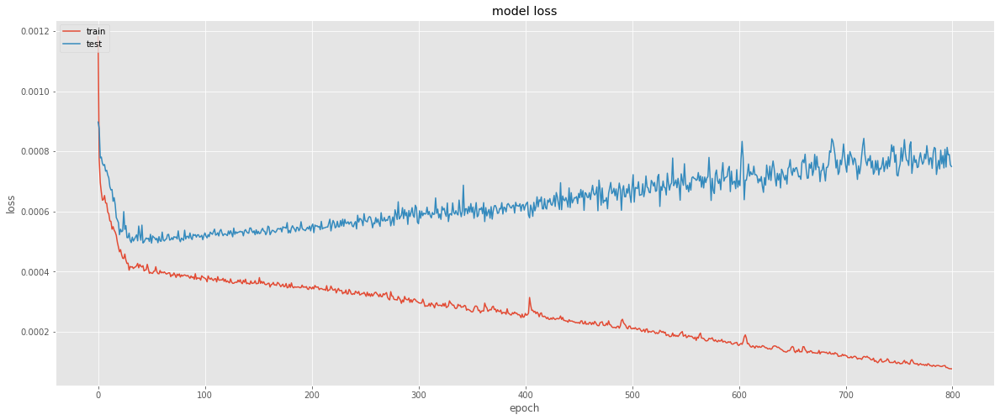

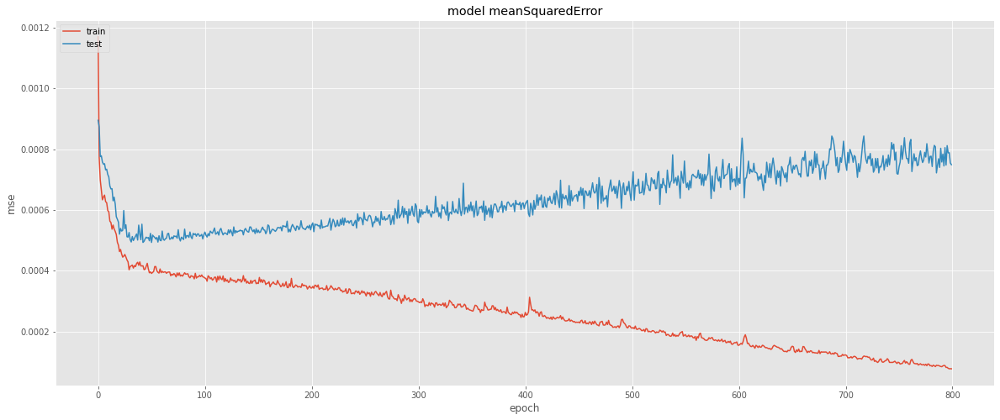

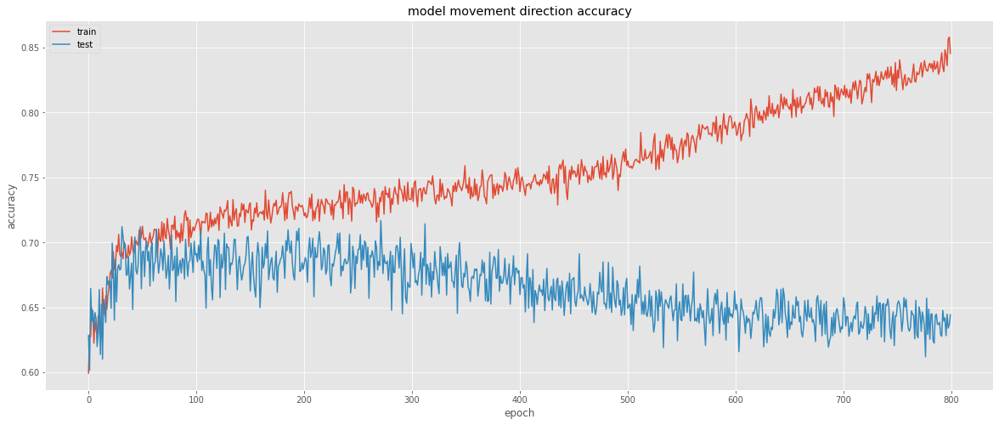

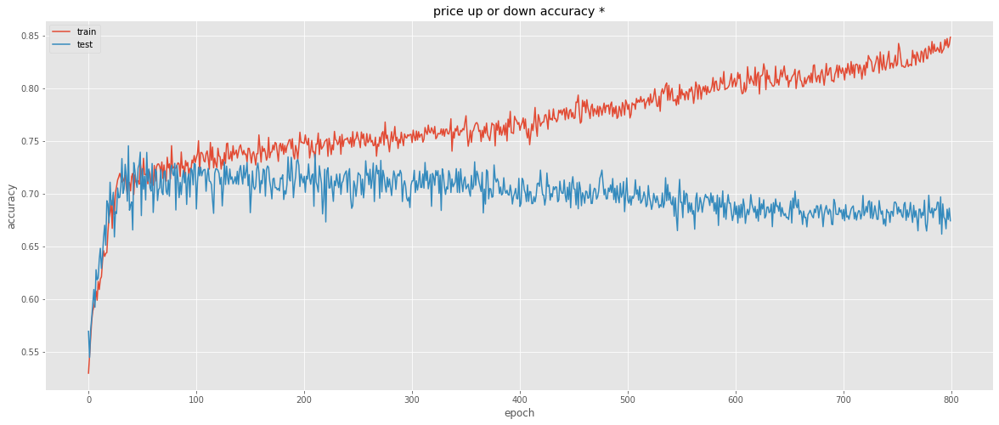

626/626 [==============================] - 5s 7ms/step - loss: 7.4949e-04 - mean_squared_error: 7.4949e-04 - movement_accuracy: 0.6454 - above_or_below_zero_accuracy: 0.6725
Mean Square Error 0.00074948603
Movement accuracy 0.6453674
Price up or down accuracy: 0.672524


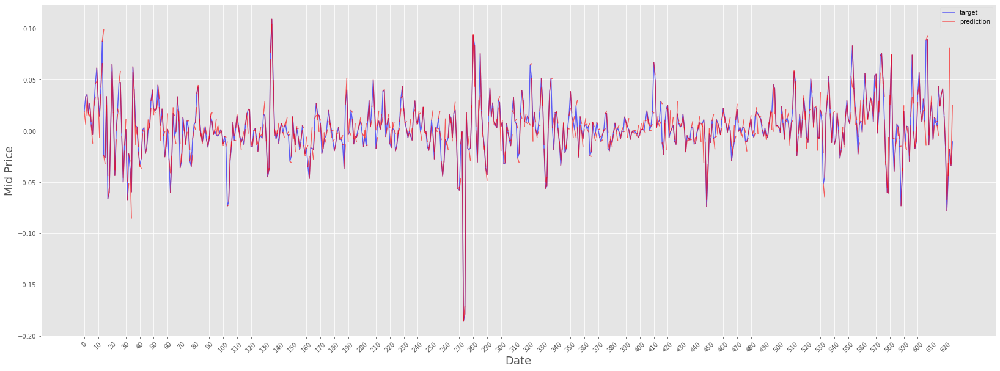

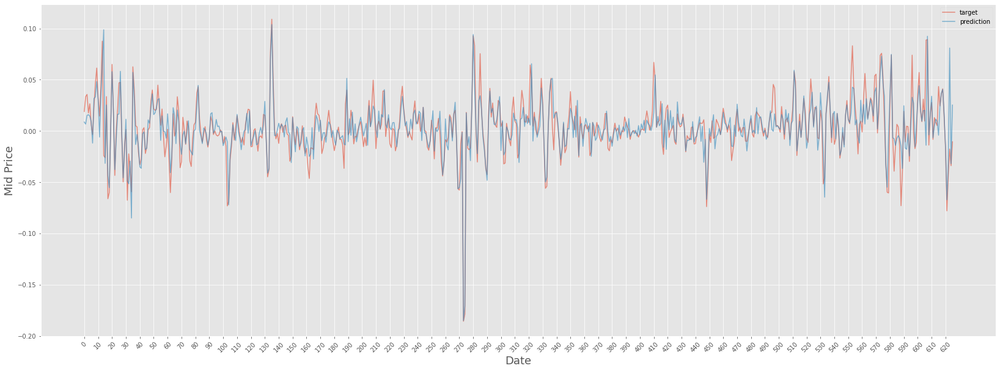

In [31]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

from metrics.custom import mean_squared_error

features = [variation, volume_variation] + event_votes_features + event_confidence_features
target = variation

model_events = build_and_run_and_show(features, target, mean_squared_error, epochs=800)

bove_or_below_zero_accuracy: 0.7487
Epoch 539/600
15/15 [==============================] - 0s 30ms/step - loss: 3.7456e-04 - mean_squared_error: 3.7467e-04 - movement_accuracy: 0.7197 - above_or_below_zero_accuracy: 0.7399 - val_loss: 4.4373e-04 - val_mean_squared_error: 4.4349e-04 - val_movement_accuracy: 0.7249 - val_above_or_below_zero_accuracy: 0.7349
Epoch 540/600
15/15 [==============================] - 0s 30ms/step - loss: 3.9669e-04 - mean_squared_error: 3.9674e-04 - movement_accuracy: 0.7137 - above_or_below_zero_accuracy: 0.7280 - val_loss: 4.4136e-04 - val_mean_squared_error: 4.4109e-04 - val_movement_accuracy: 0.7218 - val_above_or_below_zero_accuracy: 0.7517
Epoch 541/600
15/15 [==============================] - 0s 29ms/step - loss: 3.7928e-04 - mean_squared_error: 3.7933e-04 - movement_accuracy: 0.6962 - above_or_below_zero_accuracy: 0.7065 - val_loss: 4.4090e-04 - val_mean_squared_error: 4.4067e-04 - val_movement_accuracy: 0.7179 - val_above_or_below_zero_accuracy: 0.732

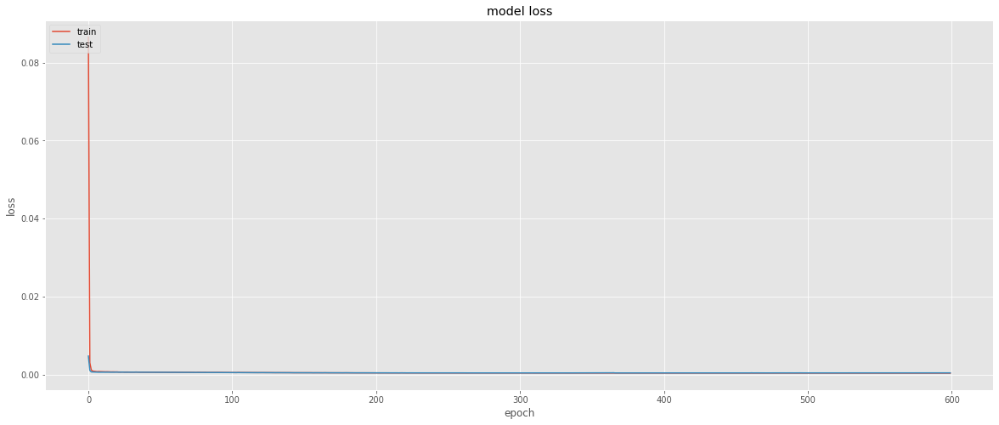

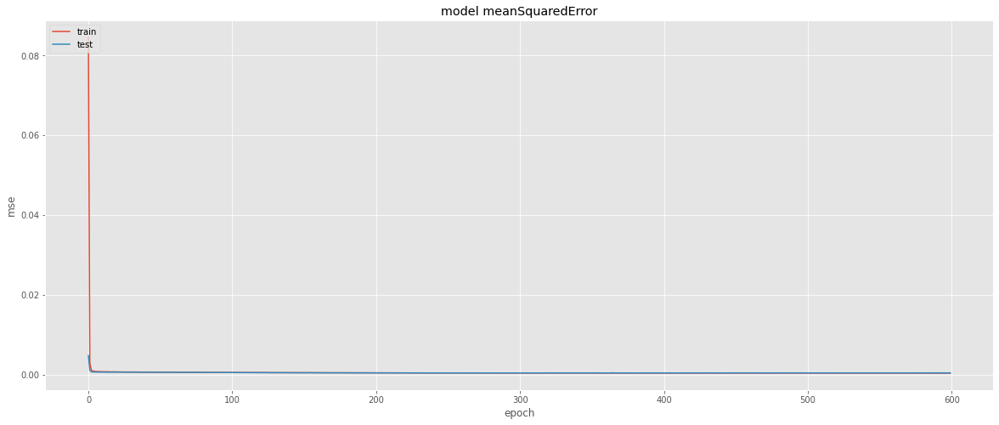

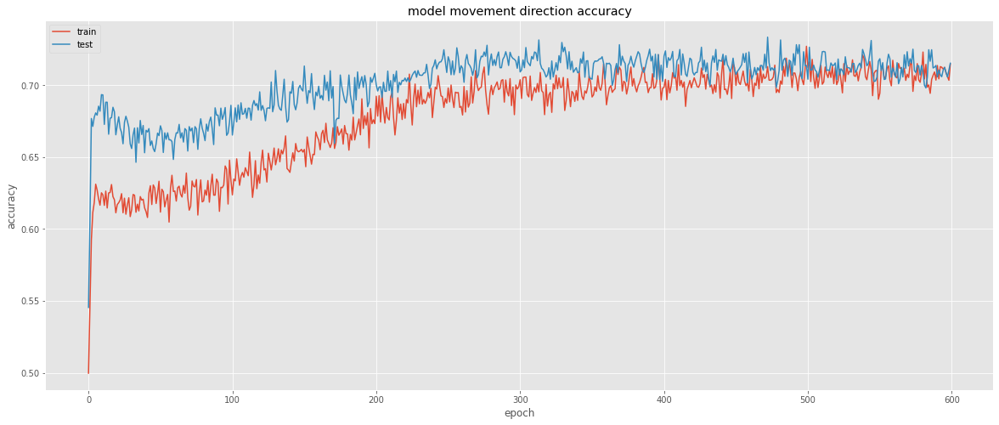

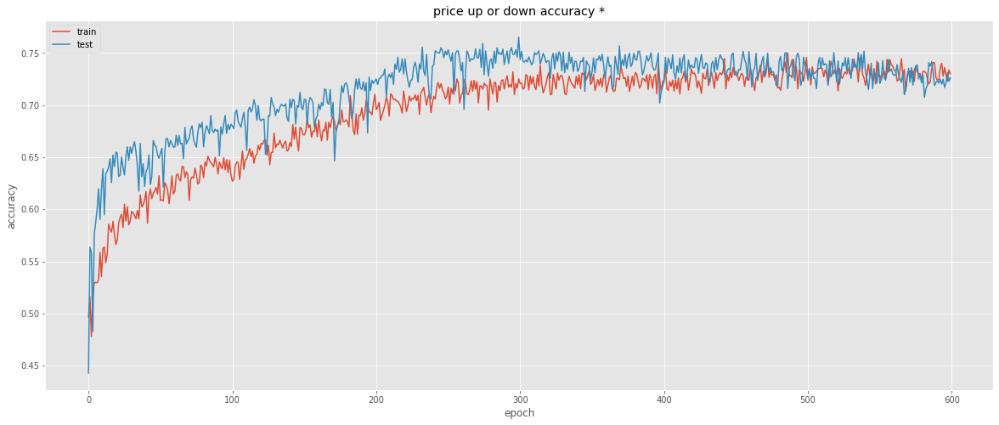

626/626 [==============================] - 5s 6ms/step - loss: 4.4052e-04 - mean_squared_error: 4.4052e-04 - movement_accuracy: 0.7157 - above_or_below_zero_accuracy: 0.7268
Mean Square Error 0.00044051645
Movement accuracy 0.71565497
Price up or down accuracy: 0.72683704


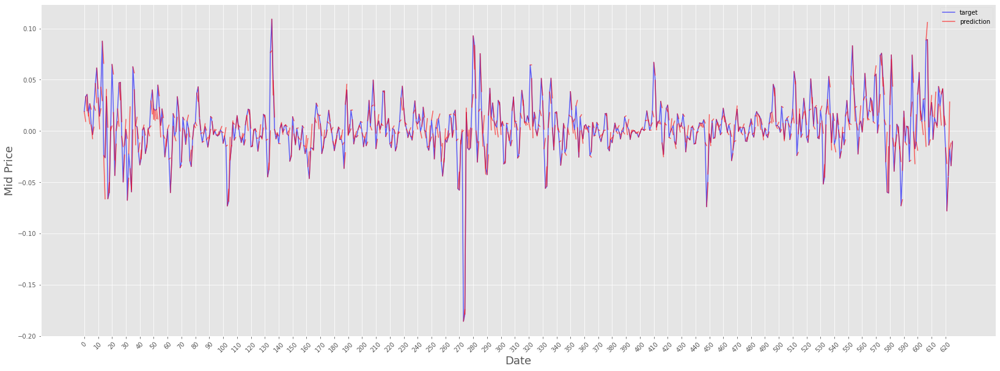

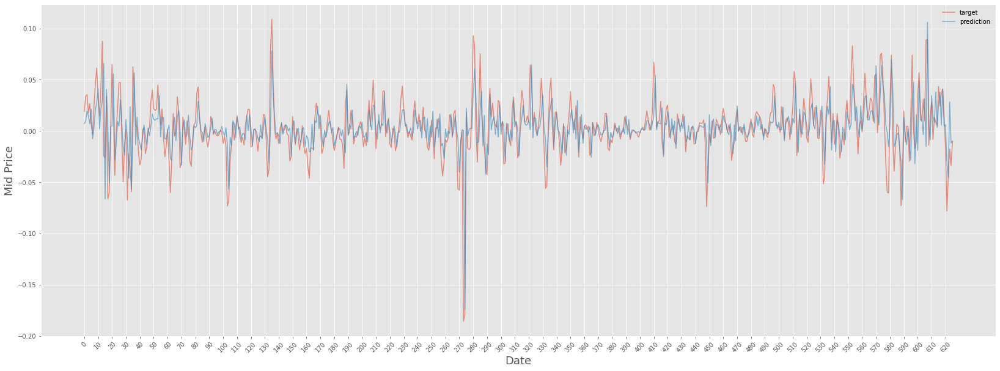

In [26]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation, google_trends]
target = variation

model_socil = build_and_run_and_show(features, target, mean_squared_error)

bove_or_below_zero_accuracy: 0.7069
Epoch 539/600
15/15 [==============================] - 0s 31ms/step - loss: 3.7412e-04 - mean_squared_error: 3.7450e-04 - movement_accuracy: 0.7302 - above_or_below_zero_accuracy: 0.7262 - val_loss: 4.7042e-04 - val_mean_squared_error: 4.7989e-04 - val_movement_accuracy: 0.6935 - val_above_or_below_zero_accuracy: 0.7294
Epoch 540/600
15/15 [==============================] - 0s 30ms/step - loss: 3.6216e-04 - mean_squared_error: 3.6226e-04 - movement_accuracy: 0.7036 - above_or_below_zero_accuracy: 0.7277 - val_loss: 4.7324e-04 - val_mean_squared_error: 4.8262e-04 - val_movement_accuracy: 0.7042 - val_above_or_below_zero_accuracy: 0.7132
Epoch 541/600
15/15 [==============================] - 0s 28ms/step - loss: 3.6493e-04 - mean_squared_error: 3.6479e-04 - movement_accuracy: 0.7345 - above_or_below_zero_accuracy: 0.7436 - val_loss: 4.7679e-04 - val_mean_squared_error: 4.8606e-04 - val_movement_accuracy: 0.6954 - val_above_or_below_zero_accuracy: 0.706

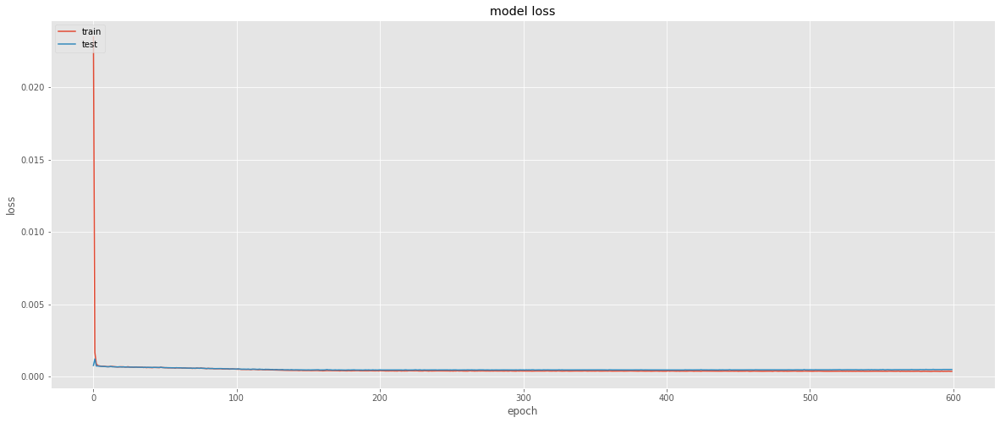

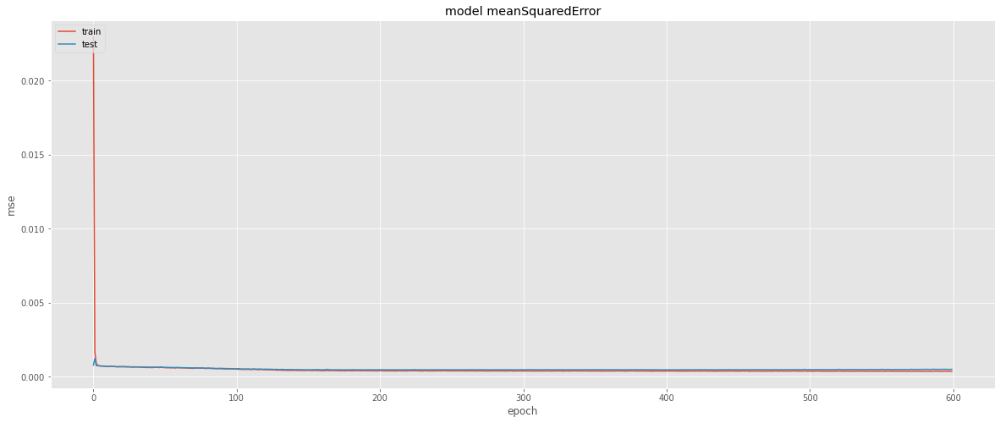

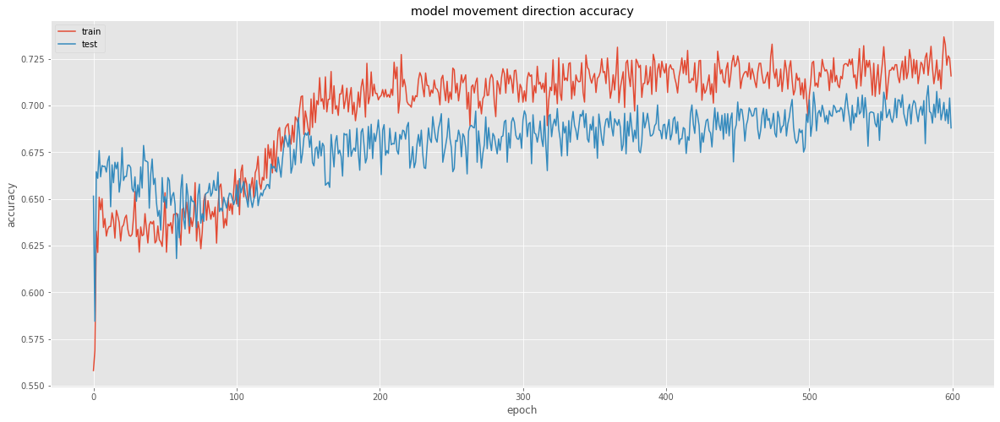

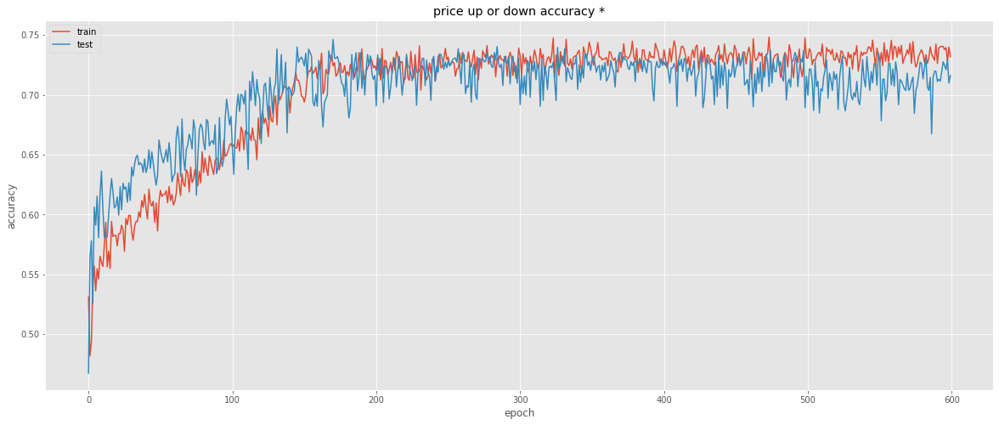

626/626 [==============================] - 5s 6ms/step - loss: 4.9192e-04 - mean_squared_error: 4.9192e-04 - movement_accuracy: 0.6885 - above_or_below_zero_accuracy: 0.7157
Mean Square Error 0.0004919177
Movement accuracy 0.6884984
Price up or down accuracy: 0.71565497


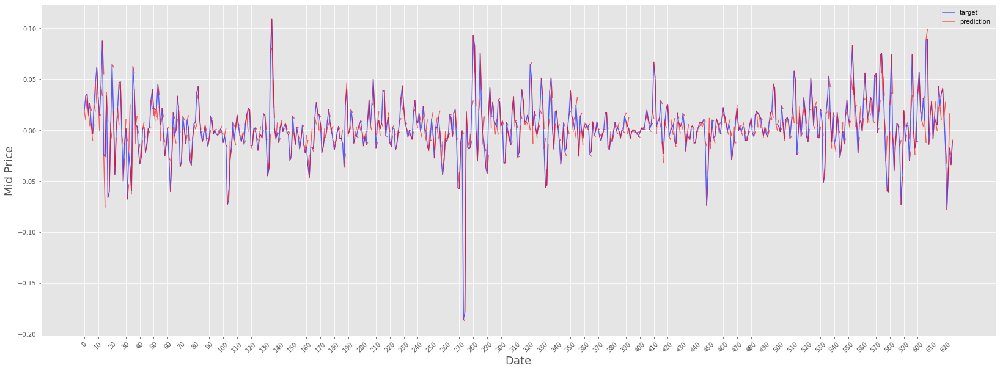

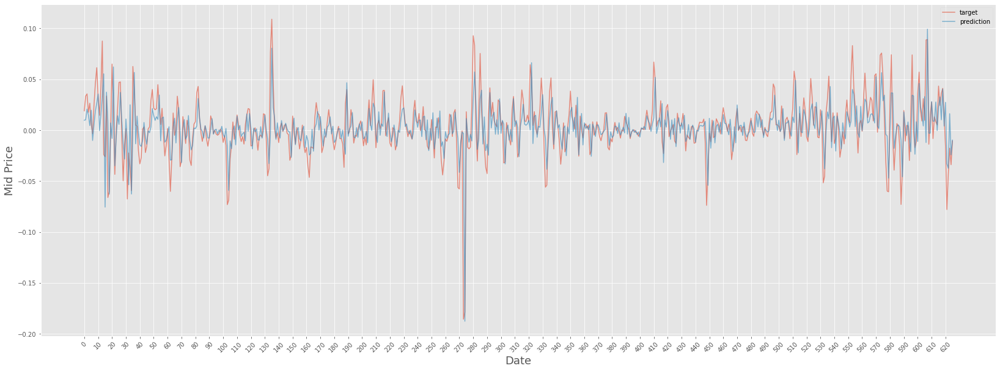

In [27]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation, tweet]
target = variation

model_socil = build_and_run_and_show(features, target, mean_squared_error)

bove_or_below_zero_accuracy: 0.7130
Epoch 739/800
15/15 [==============================] - 0s 30ms/step - loss: 2.9871e-04 - mean_squared_error: 2.9846e-04 - movement_accuracy: 0.7552 - above_or_below_zero_accuracy: 0.7347 - val_loss: 4.8466e-04 - val_mean_squared_error: 4.8866e-04 - val_movement_accuracy: 0.6794 - val_above_or_below_zero_accuracy: 0.7083
Epoch 740/800
15/15 [==============================] - 0s 31ms/step - loss: 3.1241e-04 - mean_squared_error: 3.1226e-04 - movement_accuracy: 0.7372 - above_or_below_zero_accuracy: 0.7361 - val_loss: 4.9757e-04 - val_mean_squared_error: 5.0148e-04 - val_movement_accuracy: 0.6827 - val_above_or_below_zero_accuracy: 0.7214
Epoch 741/800
15/15 [==============================] - 0s 30ms/step - loss: 2.9665e-04 - mean_squared_error: 2.9679e-04 - movement_accuracy: 0.7469 - above_or_below_zero_accuracy: 0.7396 - val_loss: 4.8798e-04 - val_mean_squared_error: 4.9220e-04 - val_movement_accuracy: 0.6796 - val_above_or_below_zero_accuracy: 0.717

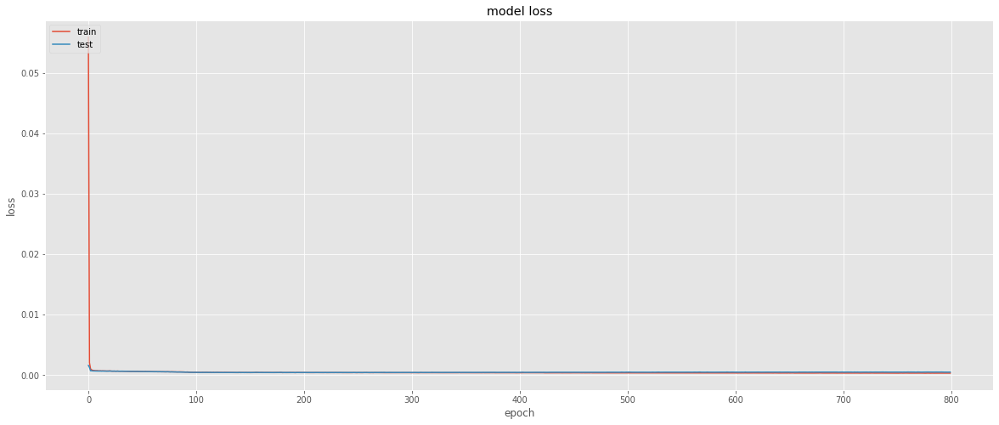

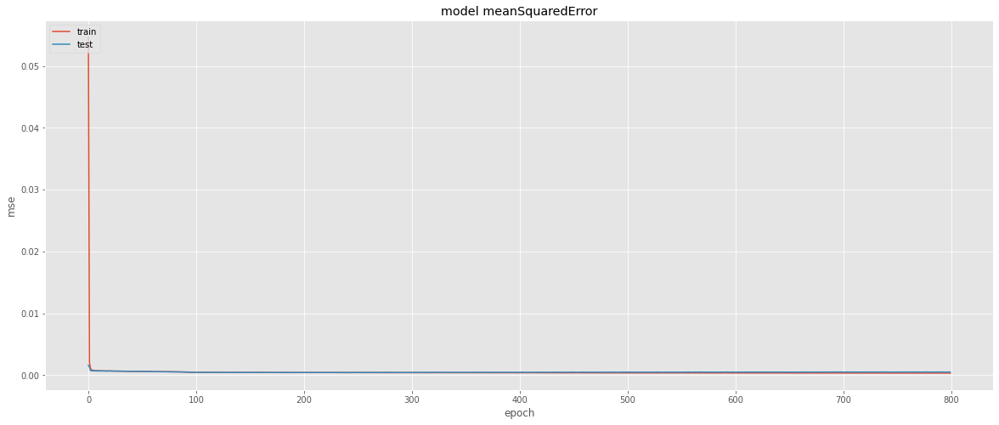

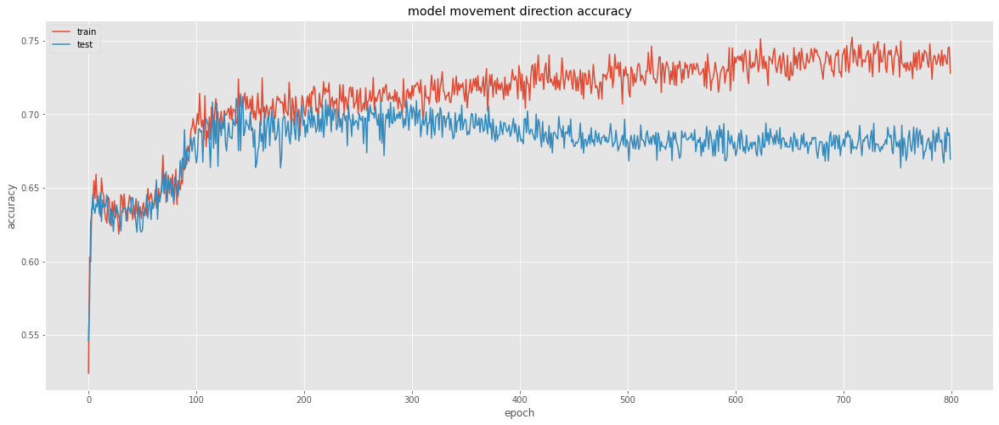

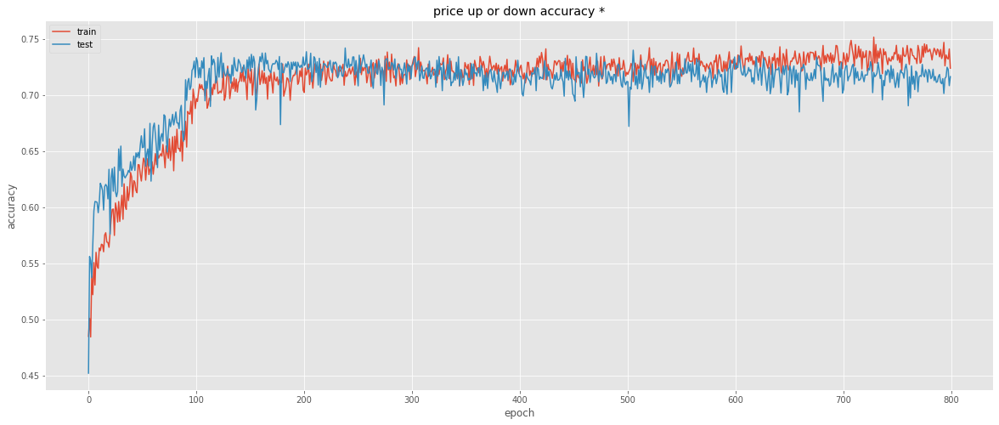

626/626 [==============================] - 5s 7ms/step - loss: 4.8870e-04 - mean_squared_error: 4.8870e-04 - movement_accuracy: 0.6693 - above_or_below_zero_accuracy: 0.7173
Mean Square Error 0.0004886957
Movement accuracy 0.66932905
Price up or down accuracy: 0.7172524


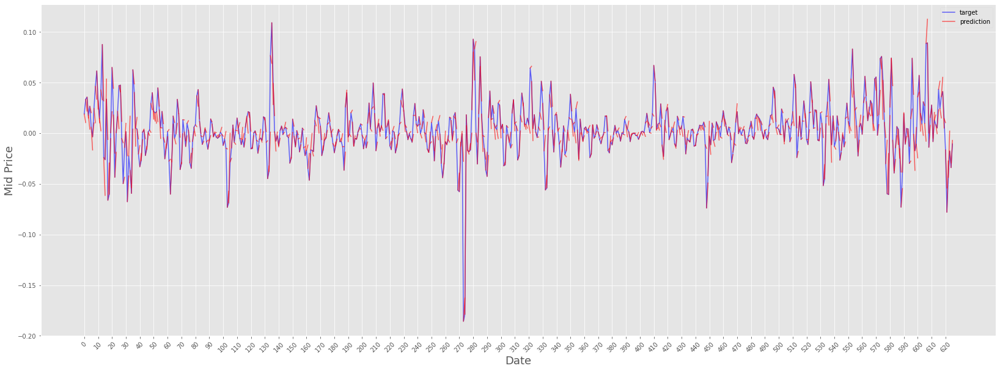

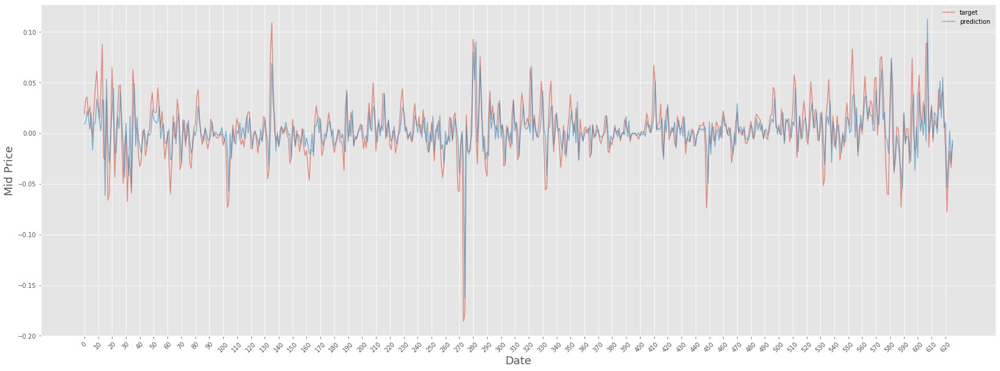

In [34]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation, google_trends, google_trends_variation]
target = variation

model_socil = build_and_run_and_show(features, target, mean_squared_error, epochs=800)

bove_or_below_zero_accuracy: 0.7034
Epoch 539/600
15/15 [==============================] - 0s 29ms/step - loss: 3.2450e-04 - mean_squared_error: 3.2457e-04 - movement_accuracy: 0.7227 - above_or_below_zero_accuracy: 0.7369 - val_loss: 5.6512e-04 - val_mean_squared_error: 5.6917e-04 - val_movement_accuracy: 0.6905 - val_above_or_below_zero_accuracy: 0.7192
Epoch 540/600
15/15 [==============================] - 0s 29ms/step - loss: 3.4272e-04 - mean_squared_error: 3.4312e-04 - movement_accuracy: 0.7342 - above_or_below_zero_accuracy: 0.7245 - val_loss: 5.6841e-04 - val_mean_squared_error: 5.7257e-04 - val_movement_accuracy: 0.6757 - val_above_or_below_zero_accuracy: 0.7185
Epoch 541/600
15/15 [==============================] - 0s 29ms/step - loss: 3.3999e-04 - mean_squared_error: 3.3985e-04 - movement_accuracy: 0.7373 - above_or_below_zero_accuracy: 0.7446 - val_loss: 5.7458e-04 - val_mean_squared_error: 5.7845e-04 - val_movement_accuracy: 0.6663 - val_above_or_below_zero_accuracy: 0.712

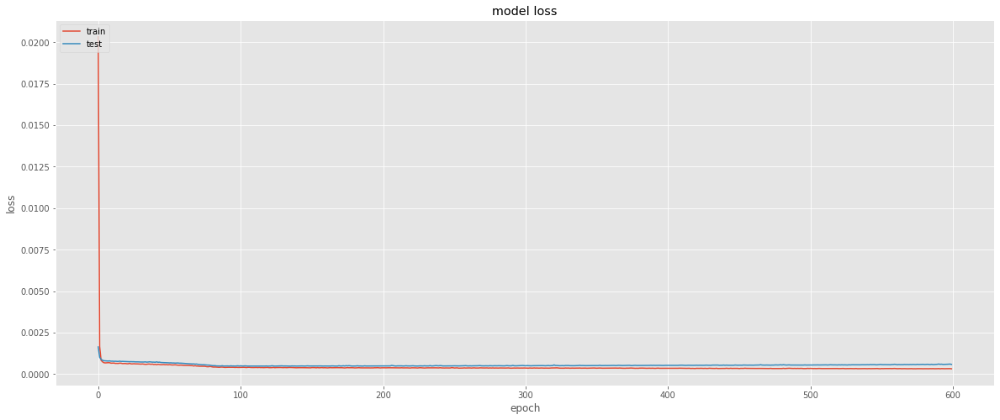

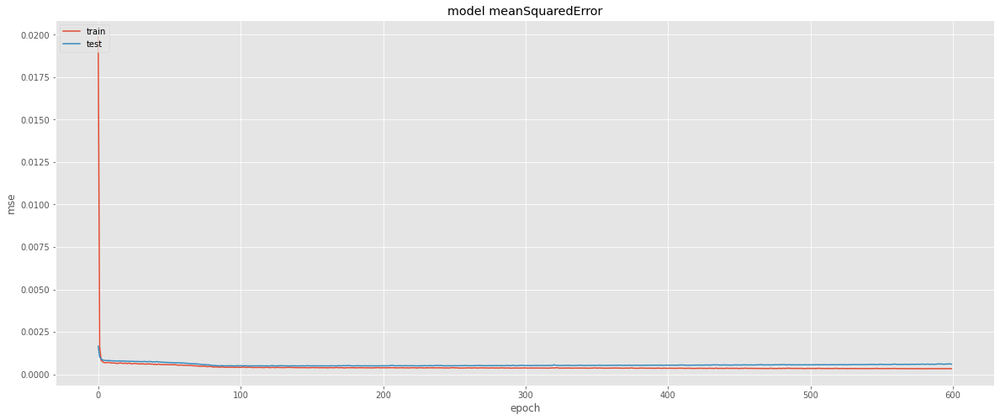

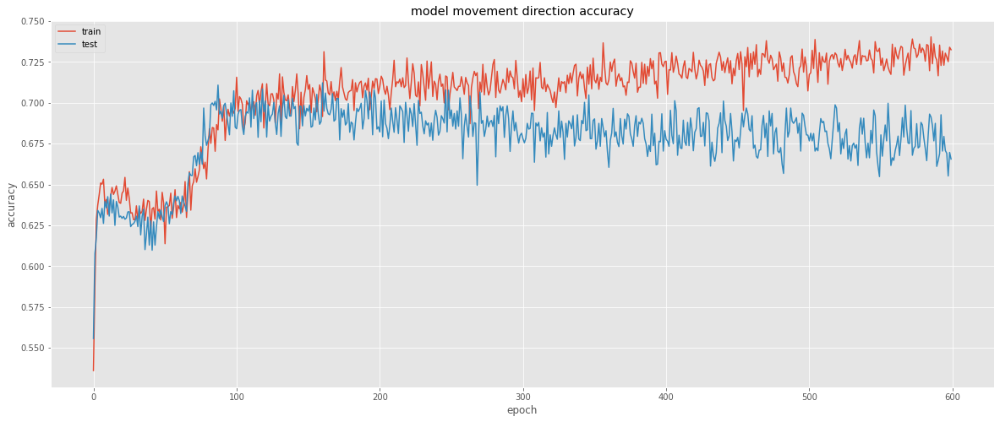

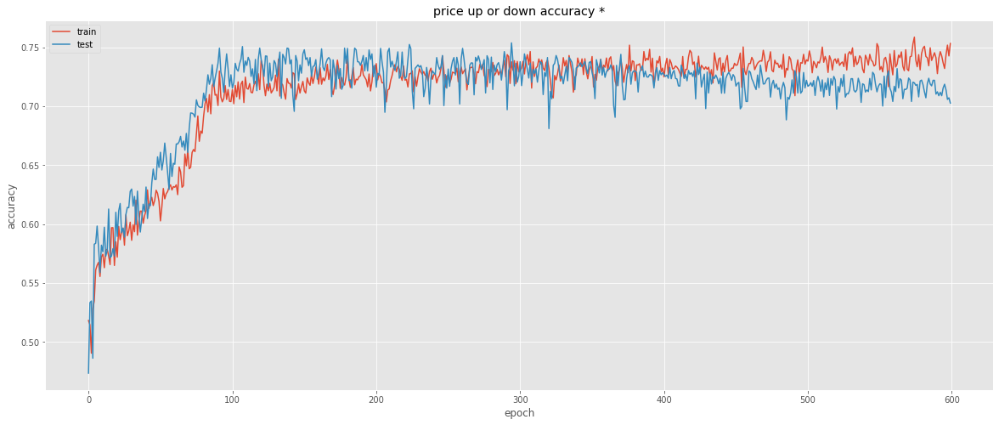

626/626 [==============================] - 6s 7ms/step - loss: 5.9138e-04 - mean_squared_error: 5.9138e-04 - movement_accuracy: 0.6645 - above_or_below_zero_accuracy: 0.7029
Mean Square Error 0.0005913802
Movement accuracy 0.6645367
Price up or down accuracy: 0.7028754


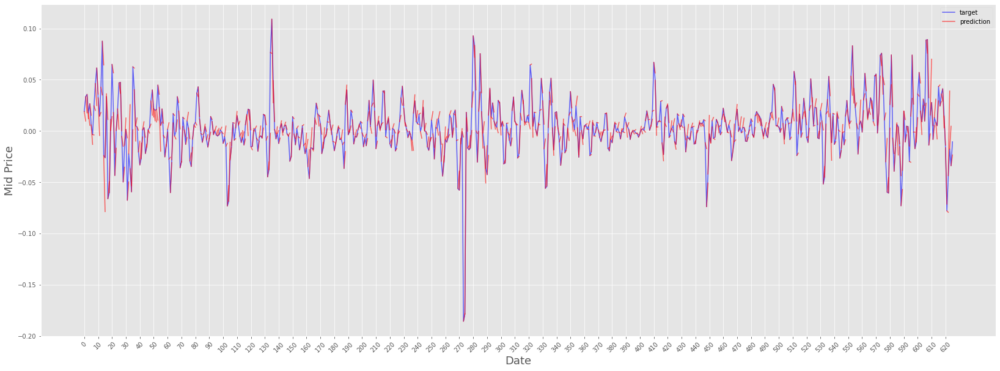

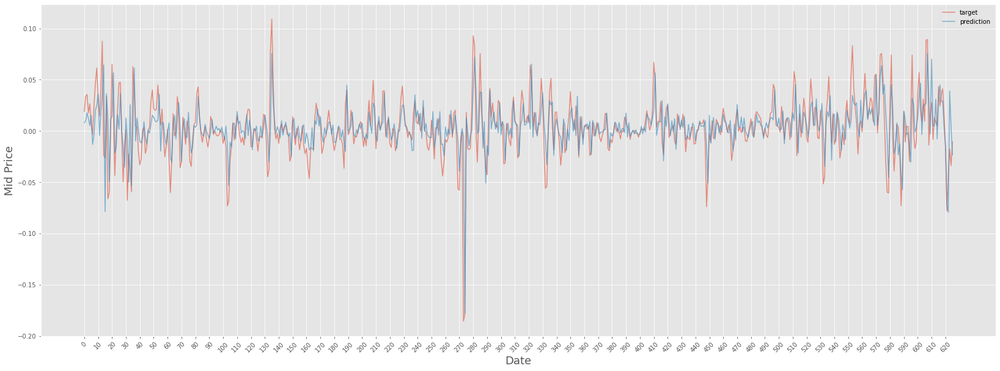

In [33]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation, tweet, tweet_variation]
target = variation

model_socil = build_and_run_and_show(features, target, mean_squared_error)

bove_or_below_zero_accuracy: 0.7331
Epoch 539/600
15/15 [==============================] - 0s 29ms/step - loss: 3.4817e-04 - mean_squared_error: 3.4823e-04 - movement_accuracy: 0.7046 - above_or_below_zero_accuracy: 0.7511 - val_loss: 4.5284e-04 - val_mean_squared_error: 4.5288e-04 - val_movement_accuracy: 0.7220 - val_above_or_below_zero_accuracy: 0.7255
Epoch 540/600
15/15 [==============================] - 0s 29ms/step - loss: 3.6758e-04 - mean_squared_error: 3.6752e-04 - movement_accuracy: 0.7075 - above_or_below_zero_accuracy: 0.7222 - val_loss: 4.4731e-04 - val_mean_squared_error: 4.4729e-04 - val_movement_accuracy: 0.7122 - val_above_or_below_zero_accuracy: 0.7318
Epoch 541/600
15/15 [==============================] - 0s 30ms/step - loss: 3.6486e-04 - mean_squared_error: 3.6497e-04 - movement_accuracy: 0.6929 - above_or_below_zero_accuracy: 0.7073 - val_loss: 4.5064e-04 - val_mean_squared_error: 4.5058e-04 - val_movement_accuracy: 0.7169 - val_above_or_below_zero_accuracy: 0.724

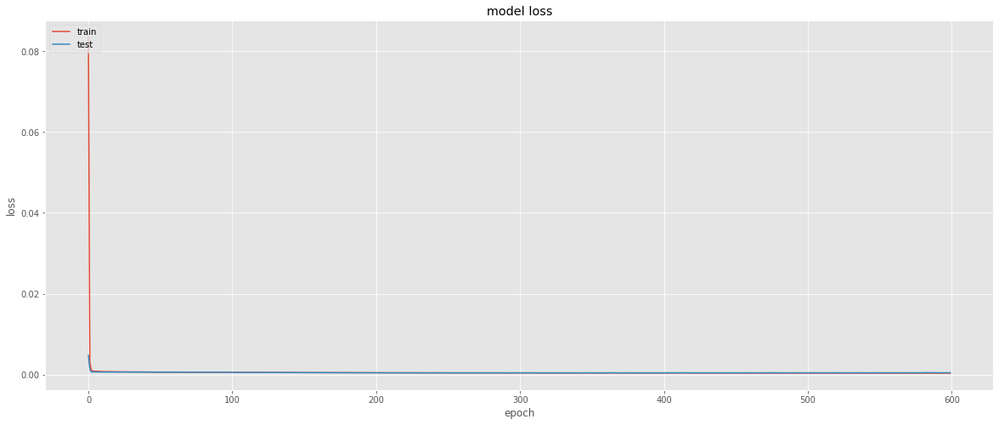

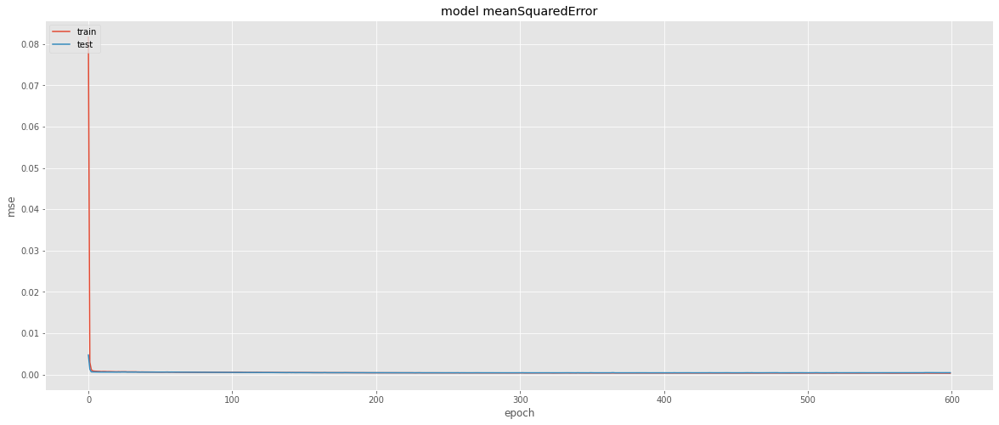

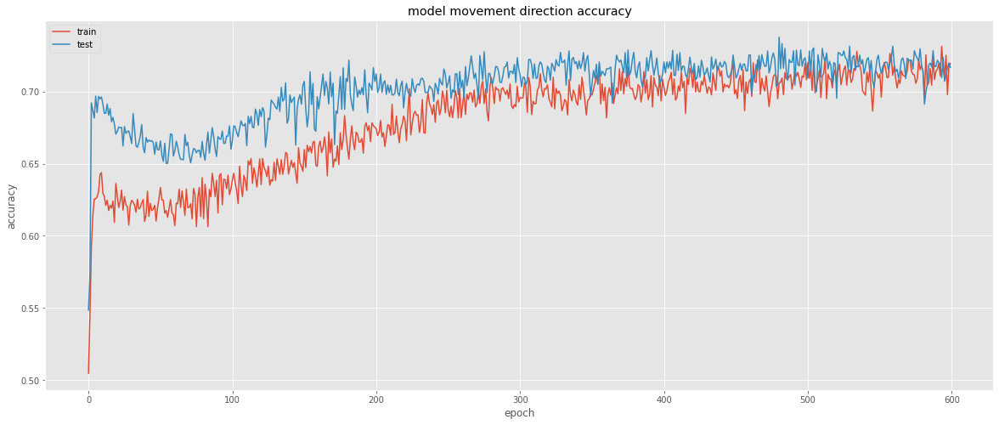

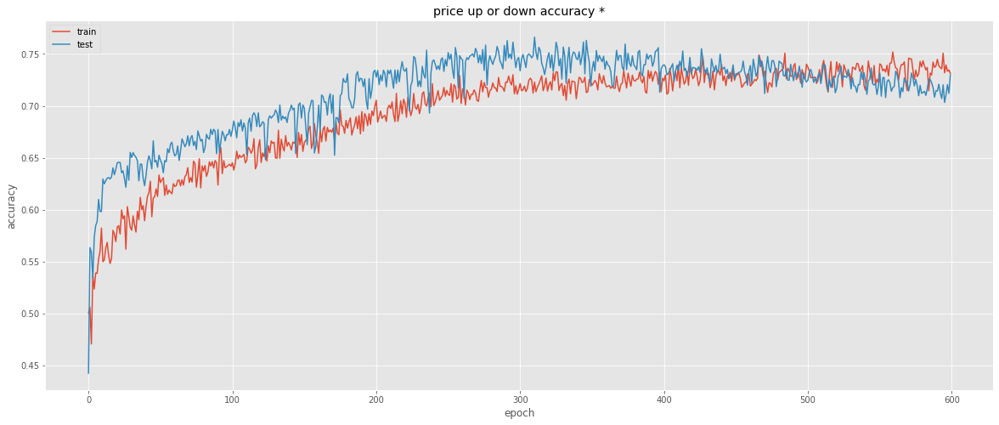

626/626 [==============================] - 6s 7ms/step - loss: 4.6070e-04 - mean_squared_error: 4.6070e-04 - movement_accuracy: 0.7173 - above_or_below_zero_accuracy: 0.7316
Mean Square Error 0.00046069635
Movement accuracy 0.7172524
Price up or down accuracy: 0.7316294


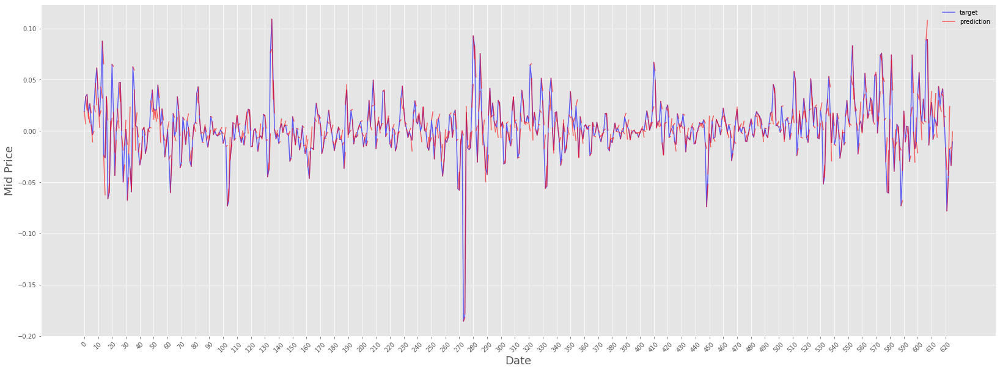

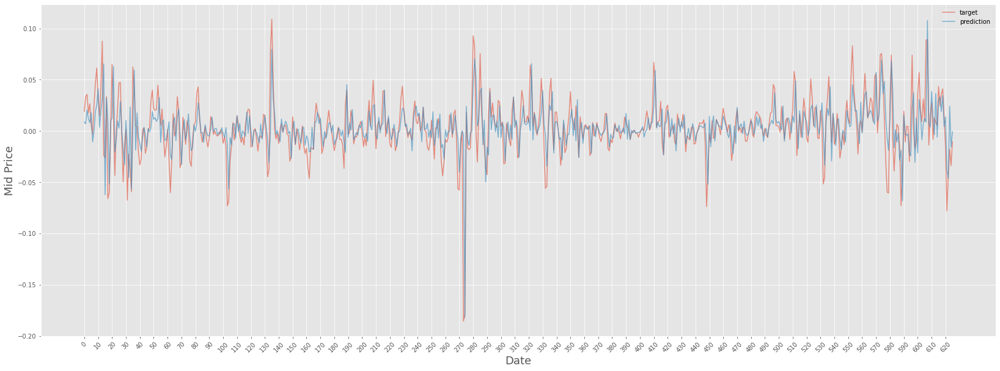

In [16]:
tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria

features = [variation, volume_variation, google_trends, tweet_variation]
target = variation

model_socil = build_and_run_and_show(features, target, mean_squared_error)

## Algumas conclusões
 - Pelo jeito então a unica feature de informações sociais que melhora os resultados é a de _**google trends**_.<br/>
 Creio que isso se dá pela seguinte lógica:
    1. quando alguem ouve falar sobre uma criptomoeda, caso ela vá investir nela provavelmente irá pesquisar sobre no google antes (ter conhecimento do projeto, e entender melhor ela).<br/>
    e só depois irá compra-la (caso goste), e consequentemente (de acordo com a lei da oferta e procura) influenciar na subida do preço.
    2. pessoas quando já estão introduzidas numa criptomoeda, não irão ficar pesquisando muito no google sobre (pois já conhecem sobre ela), mas irão provavelmente comentar sobre a criptomoeda com os amigos e nas redes sociais.<br/>
    e o aumento de postagens nas redes sociais são **consequência** da alta variação nos preços.

 resumindo, mecanismos de pesquisa (_**google_trends**_) indicam variação nos preços, e redes sociais são a consequência da variação.
 - os valores brutos (normalizados apenas) do _**google trends**_ foram mais efetivos que sua variação (%)
 - A informação de eventos parece melhorar apenas para os dados de treino, e piorar para os de teste (overfitting). 
 <br/>Possívelmente os dados de eventos são bons indicadores, porém precisam passar por algum tratamento antes para serem mais generalizados, isto é, representarem melhor todos os casos (ao invés de apenas do treino).
 Uma classificação (labelling) dos tipos de eventos poderia ser uma boa.

vamos tentar criar o melhor modelo possivel então:

bove_or_below_zero_accuracy: 0.7476
Epoch 539/600
15/15 [==============================] - 0s 32ms/step - loss: 3.9399e-04 - mean_squared_error: 3.9132e-04 - movement_accuracy: 0.7116 - above_or_below_zero_accuracy: 0.7197 - val_loss: 4.0638e-04 - val_mean_squared_error: 4.0640e-04 - val_movement_accuracy: 0.6939 - val_above_or_below_zero_accuracy: 0.7253
Epoch 540/600
15/15 [==============================] - 0s 31ms/step - loss: 4.1287e-04 - mean_squared_error: 4.1024e-04 - movement_accuracy: 0.7065 - above_or_below_zero_accuracy: 0.7138 - val_loss: 4.0057e-04 - val_mean_squared_error: 4.0080e-04 - val_movement_accuracy: 0.6999 - val_above_or_below_zero_accuracy: 0.7394
Epoch 541/600
15/15 [==============================] - 0s 31ms/step - loss: 4.0522e-04 - mean_squared_error: 4.0288e-04 - movement_accuracy: 0.7005 - above_or_below_zero_accuracy: 0.7178 - val_loss: 4.0291e-04 - val_mean_squared_error: 4.0296e-04 - val_movement_accuracy: 0.7238 - val_above_or_below_zero_accuracy: 0.747

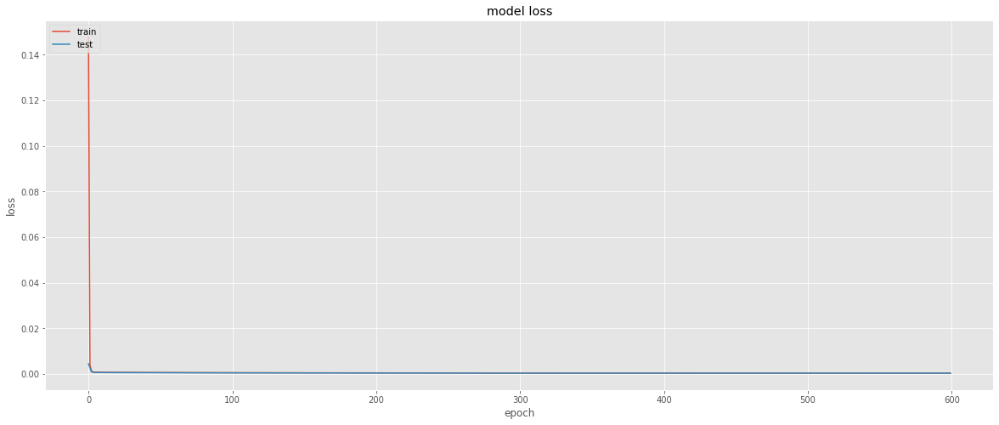

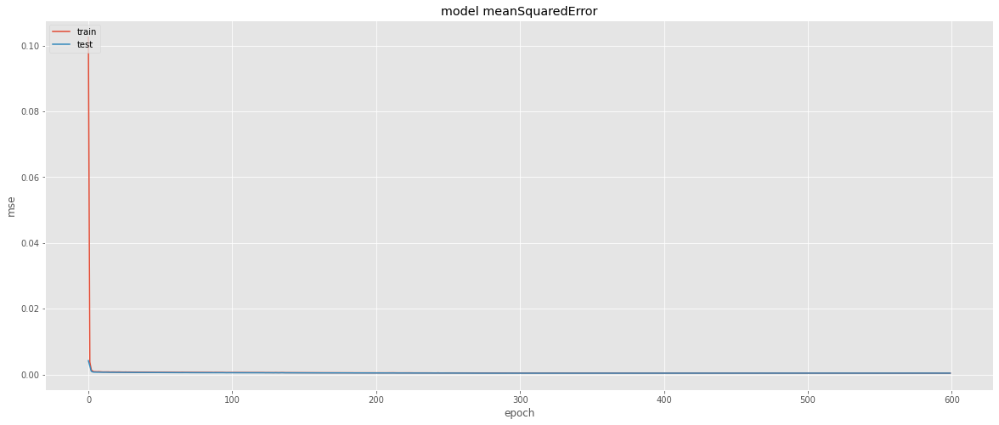

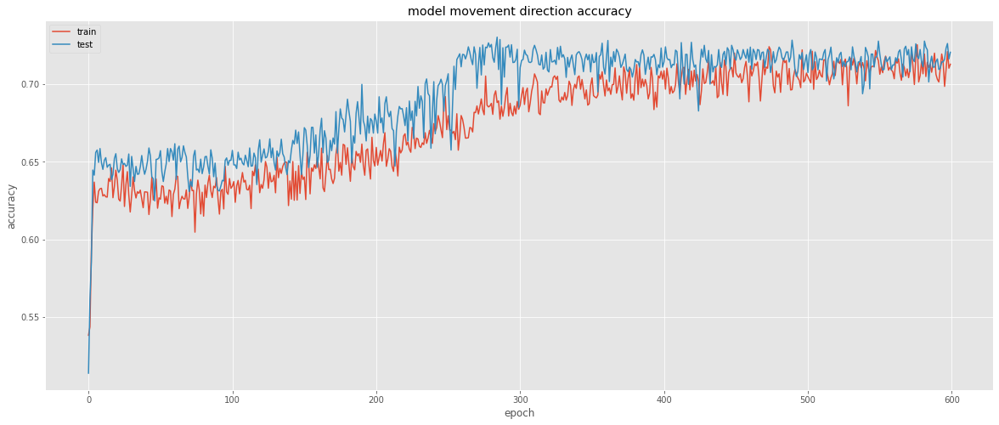

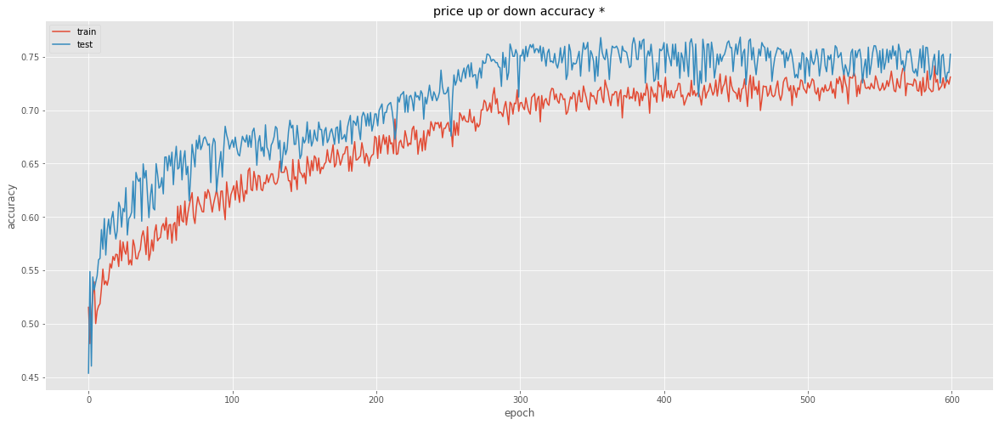

626/626 [==============================] - 6s 8ms/step - loss: 4.1909e-04 - mean_squared_error: 3.9773e-04 - movement_accuracy: 0.7220 - above_or_below_zero_accuracy: 0.7524
Mean Square Error 0.0003977314
Movement accuracy 0.7220447
Price up or down accuracy: 0.75239617


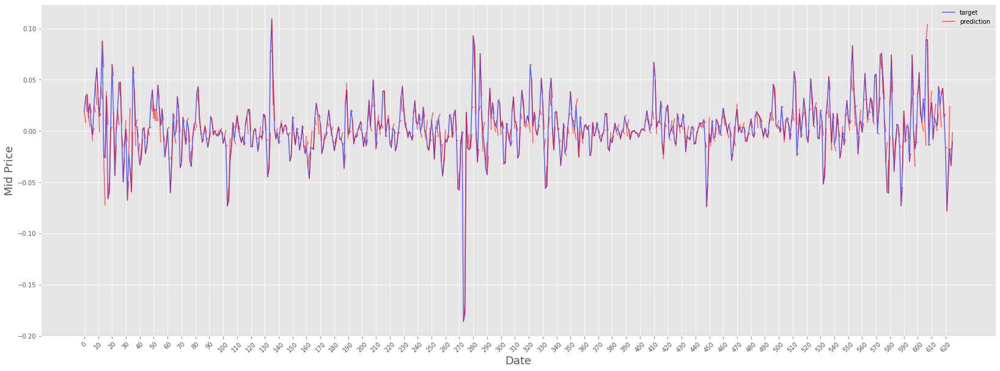

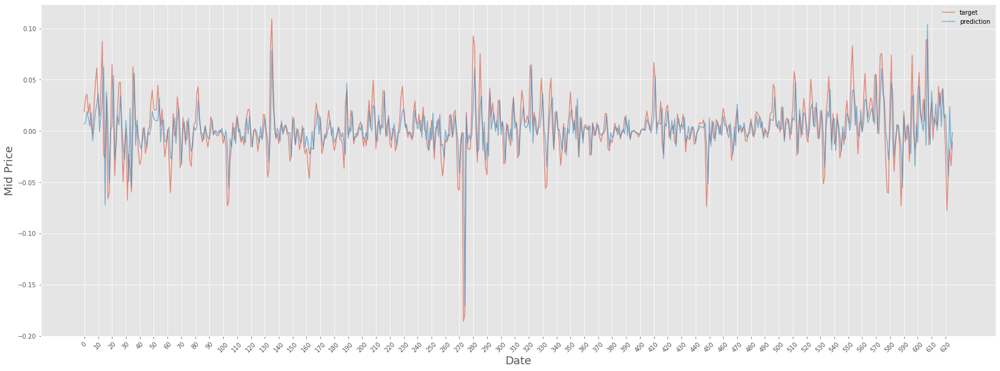

In [23]:
tf.keras.backend.clear_session()
from metrics.custom import custom_loss2, custom_loss, custom_movement_accuracy

features = [variation, volume_variation, google_trends, tweet]
target = variation

modelo_final = build_and_run_and_show(features, target, custom_loss, epochs=400)